# A521
## Find the best threshold for clump detection but with unbinned cube (10 km/s)

Here we take the full cube and try to find clumps in empty regions close to the object (ie. false positives). This will help establish the limits on the dendrograms parameters

In [1]:
%matplotlib notebook
import matplotlib.pylab as plt
from matplotlib.patches import Ellipse
from matplotlib.patches import Polygon
from matplotlib.path import Path

import seaborn as sns
sns.set(style="whitegrid")
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:90% !important; }</style>"))

import warnings
warnings.filterwarnings('ignore')

import numpy as np

from scipy.ndimage import filters

from astropy.io import fits
from astropy import units as u
from astropy.stats import sigma_clipped_stats
from astropy.table import Table,Column
from astropy.wcs import WCS
from astropy.modeling import models, fitting

from reproject import reproject_interp

from astrodendro import Dendrogram, ppv_catalog
from astrodendro.analysis import PPVStatistic

from astropy.cosmology import WMAP9 as cosmo

## Load data and get observations properties

Load data

In [2]:
wcs_alma =  WCS(fits.getheader('../Data/Moments/a521_mom0.fits'))
wcs_alma.wcs.crpix = wcs_alma.wcs.crpix - [550,600] # to compensate the cropping
mom0 = fits.getdata('../Data/Moments/a521_mom0.fits')[600:1200,550:1150]
mom1 = fits.getdata('../Data/Moments/a521_mom1.fits')[600:1200,550:1150]
alma = fits.open('../Data/Moments/a521_mom0.fits')[0]


HST_red,_ = reproject_interp('../Data/HST/A521_F160w.fits',alma.header)
HST_green,_ = reproject_interp('../Data/HST/A521_F105w.fits',alma.header)
HST_blue,_ = reproject_interp('../Data/HST/A521_F390w.fits',alma.header)

oii_vel, _ = reproject_interp('../Data/MUSE/A521_model_exp.fits',alma.header)
oii_vel[np.where(oii_vel == 0)] = np.nan
oii_vel = oii_vel[600:1200,550:1150]

# Load and crop ALMA cube
alma_header = fits.getheader('../Data/Moments/a521_mom0.fits')
alma_data = np.squeeze(fits.getdata('../Data/Cubes/A521_CO_4-3_pbcor.fits')) # Hz,pix,pix 
broken_header = fits.open('../Data/Cubes/A521_CO_4-3_pbcor.fits')[0].header
broken_header.remove('ORIGIN')
wcs_cube = WCS(broken_header)
#wcs_cube = wcs_cube.dropaxis(3)
wcs_cube.wcs.crpix = wcs_cube.wcs.crpix - [600,550,105] # to compensate the cropping
crop_data = alma_data[105:135,600:1200,550:1150] # Cut also in spectral window in the same way we cut for the mom0
alma_im = np.nanmean(crop_data,axis=0)


# Load HST data to compare
hst_im,_ = reproject_interp('../Data/HST/A521_F390W.fits',alma_header)
hst_im = hst_im[600:1200,550:1150]

def crop_image(im):
    return im[600:1200,550:1150]

Verify the cube velocity steps

In [3]:
from astropy.constants import c

def channel_width(file):
    wcs  = fits.getheader(file)
    print(-wcs['CDELT3']/wcs['CRVAL3']* c.to('km/s'))

channel_width('../Data/Cubes/A521_CO_4-3_pbcor.fits')

10.335964612828652 km / s


Flux units

In [4]:
header  = fits.getheader('../Data/Cubes/A521_CO_4-3_pbcor.fits')
header['BUNIT']

'Jy/beam'

### Measure the beam size

<IPython.core.display.Javascript object>


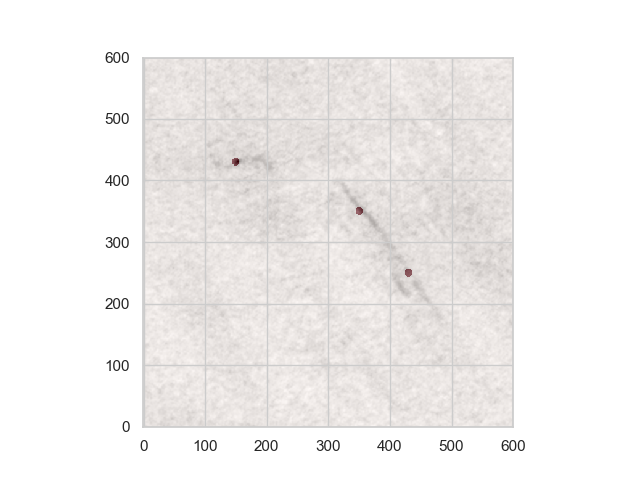

In [5]:
def beam(x0,y0,a=5.641585836808E-05/8.333E-06,b=4.732591824399E-05/8.333E-06):
    x,y = np.mgrid[0:mom0.shape[0],0:mom0.shape[1]]
    ellipse = ((x-x0)/a)**2 + ((y-y0)/b)**2 < 1
    return ellipse.astype(int)

elli_complete = beam(430,150)
elli_east = beam(350,350)
elli_west = beam(250,430)
elli_all = elli_complete+elli_east+elli_west

fig, ax = plt.subplots(1,1)
ax.imshow(mom0,origin='lower',cmap='Greys')
ax.imshow(elli_all,origin='lower',alpha=0.5,cmap='Reds')

header = wcs_alma.to_header()
## Compensate for the cropping
header['CRPIX1'] -= 600
header['CRPIX2'] -= 550

fits.writeto('../Data/LensigStuff/A521/beams.fits',data=elli_all,header=header,overwrite=True)

Measure beam in source plane

<IPython.core.display.Javascript object>


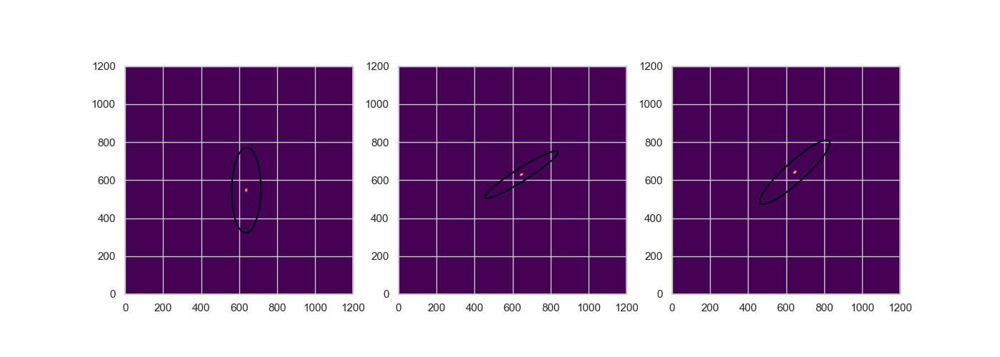

Complete image: 0.50 1.46
Complete east: 1.48 0.22
Complete west: 0.35 1.59


In [5]:
beam_source_plane_complete = fits.getdata('../Data/LensigStuff/A521/SP_beams_complete.fits')
beam_source_plane_east = fits.getdata('../Data/LensigStuff/A521/SP_beams_east.fits')
beam_source_plane_west = fits.getdata('../Data/LensigStuff/A521/SP_beams_west.fits')
header_source_plane = fits.getheader('../Data/LensigStuff/A521/SP_beams_complete.fits')

# Plot
fig, ax = plt.subplots(1,3,figsize=(14,5))
ax[0].imshow(beam_source_plane_complete,origin='lower',vmin=0,vmax=1,cmap='viridis')
ax[1].imshow(beam_source_plane_east,origin='lower',vmin=0,vmax=1,cmap='viridis')
ax[2].imshow(beam_source_plane_west,origin='lower',vmin=0,vmax=1,cmap='viridis')


# Fit
y, x = np.mgrid[:beam_source_plane_complete.shape[0], :beam_source_plane_complete.shape[1]]

# Fit complete image beam
p_init = models.Gaussian2D(x_mean=636,y_mean=546)
fit_p = fitting.LevMarLSQFitter()
p = fit_p(p_init, x, y, beam_source_plane_complete)
ax[0].contour(p(x, y), origin='lower')
print('Complete image: %0.2f %0.2f'%(p.x_stddev.value*header_source_plane['CDELT2']*3600/cosmo.arcsec_per_kpc_comoving(1.04).value, p.y_stddev.value*header_source_plane['CDELT2']*3600/cosmo.arcsec_per_kpc_comoving(1.04).value)) 

# Fit east
p_init = models.Gaussian2D(x_mean=646,y_mean=629)
fit_p = fitting.LevMarLSQFitter()
p = fit_p(p_init, x, y, beam_source_plane_east)
ax[1].contour(p(x, y), origin='lower')
print('Complete east: %0.2f %0.2f'%(p.x_stddev.value*header_source_plane['CDELT2']*3600/cosmo.arcsec_per_kpc_comoving(1.04).value, p.y_stddev.value*header_source_plane['CDELT2']*3600/cosmo.arcsec_per_kpc_comoving(1.04).value)) 

# Fit west
p_init = models.Gaussian2D(x_mean=645,y_mean=641)
fit_p = fitting.LevMarLSQFitter()
p = fit_p(p_init, x, y, beam_source_plane_west)
ax[2].contour(p(x, y), origin='lower')
print('Complete west: %0.2f %0.2f'%(p.x_stddev.value*header_source_plane['CDELT2']*3600/cosmo.arcsec_per_kpc_comoving(1.04).value, p.y_stddev.value*header_source_plane['CDELT2']*3600/cosmo.arcsec_per_kpc_comoving(1.04).value)) 

Beam size

In [4]:
header = fits.getheader('../Data/Cubes/A521_CO_4-3_pbcor.fits')

beam_area = np.pi /(4*np.log(2)) * header['BMAJ'] * header['BMIN']
beam_area_pix = beam_area/ header['CDELT1']**2
print('Beam_area in pix %0.2f'%beam_area_pix)
print('Beam area in arcsec: %0.2e'%beam_area)

# Calculate area but of a beam with less one pixel in radius
beam_area_min = np.pi /(4*np.log(2)) * (header['BMAJ']-abs(header['CDELT1'])) *( header['BMIN']-abs(header['CDELT1']))
beam_area_min_pix = beam_area_min/ header['CDELT1']**2
print('Beam_area in pix %0.2f'%beam_area_min_pix)
print('Beam area in arcsec: %0.2e'%beam_area_min)

Beam_area in pix 43.56
Beam area in arcsec: 3.03e-09
Beam_area in pix 30.59
Beam area in arcsec: 2.12e-09


### Define empty and HST regions

<IPython.core.display.Javascript object>


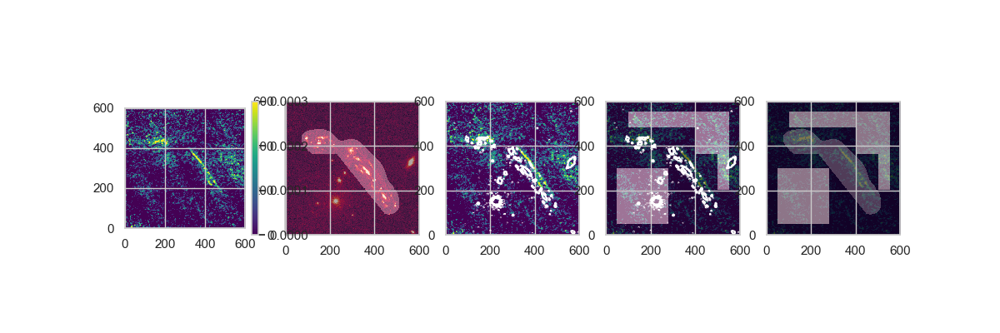

Pixels in HST region: 58397
Pixels in empty region 1: 57500
Pixels in empty region 2: 57500


In [5]:
# Load HST image and make mask
hst_smooth = filters.gaussian_filter(hst_im, sigma=25)
rms_hst = np.sqrt(np.nanmean((hst_im - np.nanmean(hst_im))**2))
mask = hst_smooth > 0.3*rms_hst
mask[200:398,490:599]  = 0 
mask[:,-70:]  = 0 
x,y = np.meshgrid(range(mask.shape[0]),range(mask.shape[1]))
mask[np.where((y < x*-1.25+650) & (y<360))] = 0

# Define empty regions
box1 = np.zeros_like(hst_im)
box1[50:300,50:280] = 1
box1[480:550,100:550] = 1
box1[360:480,400:550] = 1
box1[200:480,500:550] = 1

mask2 = np.zeros_like(hst_im)
mask2[50:300,50:280] = 1

mask1 = np.zeros_like(hst_im)
mask1[480:550,100:550] = 1
mask1[360:480,400:550] = 1
mask1[200:480,500:550] = 1

fig, ax = plt.subplots(1,5,figsize=(12,4))
cax = ax[0].imshow(alma_im,vmin=0,vmax=0.0003,origin='lower',cmap='viridis')
cbar = fig.colorbar(cax,fraction=0.05,ax=ax[0])

ax[1].imshow(hst_im,origin='lower',vmax=0.05)
ax[1].imshow(mask,origin='lower',alpha=0.3)

ax[2].imshow(alma_im,vmin=0,vmax=0.0003,origin='lower',cmap='viridis')
ax[2].contour(hst_im,levels=[0.02],colors='w')

ax[3].imshow(alma_im,vmin=0,vmax=0.0003,origin='lower',cmap='viridis')
ax[3].contour(hst_im,levels=[0.02],colors='w',linewidth=0.8)
ax[3].imshow(box1,origin='lower',alpha=0.5)

ax[4].imshow(alma_im,vmin=0,vmax=0.0003,origin='lower',cmap='viridis')
ax[4].imshow(mask,origin='lower',alpha=0.5)
ax[4].imshow(box1,origin='lower',alpha=0.5)

#f = [x.axis('off') for x in ax]

print('Pixels in HST region: %d'%len(np.where(mask==1)[1]))
print('Pixels in empty region 1: %d'%len(np.where(mask1==1)[1]))
print('Pixels in empty region 2: %d'%len(np.where(mask2==1)[1]))

Save mask

In [ ]:
fits.writeto('a521_target_mask.fits',data=np.array(mask).astype(int),header=wcs_alma.to_header())

### Measure noise level

In [6]:
_,_,rms11 = sigma_clipped_stats(crop_data[:,480:550,100:550])
_,_,rms12 = sigma_clipped_stats(crop_data[:,360:480,400:550])
_,_,rms13 = sigma_clipped_stats(crop_data[:,200:480,500:550])
_,_,rms2 = sigma_clipped_stats(crop_data[:,50:300,50:280])

print('RMS box11 %0.6f'%rms11)
print('RMS box12 %0.6f'%rms12)
print('RMS box13 %0.6f'%rms13)
print('RMS box1 %0.6f'%np.mean((rms11,rms12,rms13)))
print('RMS box2 %0.6f'%rms2)

rms = np.mean((rms11,rms12,rms13,rms2))
print('Mean RMS %0.6f'%rms)

RMS box11 0.000413
RMS box12 0.000380
RMS box13 0.000386
RMS box1 0.000393
RMS box2 0.000360
Mean RMS 0.000385


# Detect clumps!

Some useful functions

In [7]:
from astrodendro.pruning import all_true

def is_inside_box1(structure, index=None, value=None):
    peak_index, peak_value = structure.get_peak()
    return mask1[peak_index[1],peak_index[2]]

def is_inside_box2(structure, index=None, value=None):
    peak_index, peak_value = structure.get_peak()
    return mask2[peak_index[1],peak_index[2]]

def is_inside_box(structure, index=None, value=None):
    peak_index, peak_value = structure.get_peak()
    return np.any((mask1[peak_index[1],peak_index[2]],mask2[peak_index[1],peak_index[2]]))


def is_inside_hst(structure, index=None, value=None):
    peak_index, peak_value = structure.get_peak()
    return mask[peak_index[1],peak_index[2]]

# Limit to structures that span at least 2 channels
def min_2_chan(structure, index=None, value=None):
    return len(set(structure.indices()[0])) >= 2.

def min_beam_size(structure, index=None, value=None):
    """ Loop in the channels to make sure at least one has more than 30 pixels (spatial direction)."""
    c, x, y = structure.indices()
    test = False
    for channel in set(c):
        pix = np.where(c==channel)
        if len(x[pix]) > 31. :
            test = True
    return test

In [8]:
def plot_to_compare(d,p,title,im=alma_im):

    # 3D selection
    fig,ax = plt.subplots(1, 2, figsize=(12,5))
    fig.suptitle(title)
    ax[0].imshow(im, origin='lower', interpolation='nearest',cmap=plt.cm.Blues, vmax=2*rms,vmin=0)

    leaves = []
    for nb,leaf in enumerate(d.leaves):
        leaves.append(leaf.idx)
        p.plot_contour(ax[0], structure=leaf, lw=3, colors='orange')
        s = PPVStatistic(leaf)
        ellipse = s.to_mpl_ellipse(edgecolor='m', facecolor='none',lw=1.5)
        ax[0].add_patch(ellipse)
        ax[0].annotate('%s'%nb,xy=ellipse.center,color='m')     

    p.plot_tree(ax[1], color='black')
    ax[1].set_xlabel("Structure")
    ax[1].set_ylabel("Flux")

### Establish the fiducual thresholds

Keep delta=1 and find the calue of min_value for which there are no detections in the empty region.

Fiducial threshold: 3.5 RMS

<IPython.core.display.Javascript object>


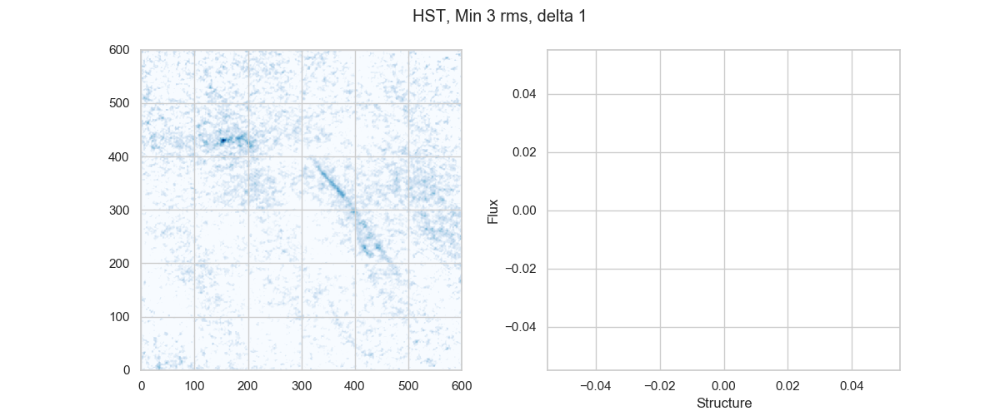

<IPython.core.display.Javascript object>


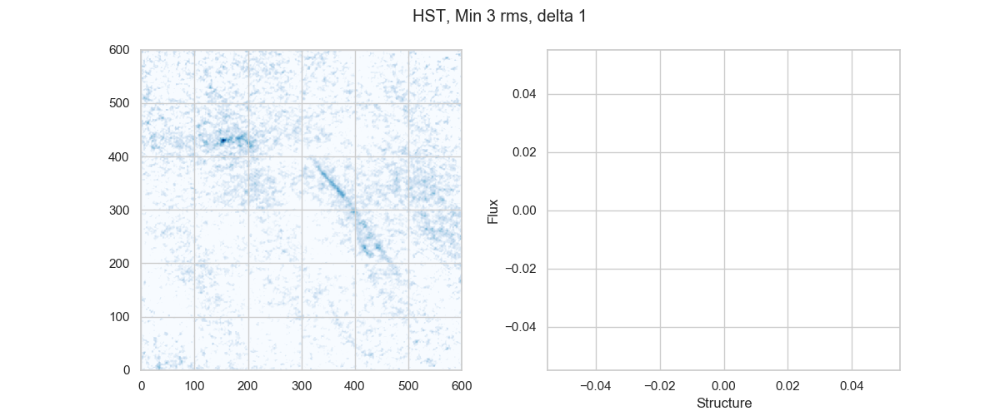

<IPython.core.display.Javascript object>


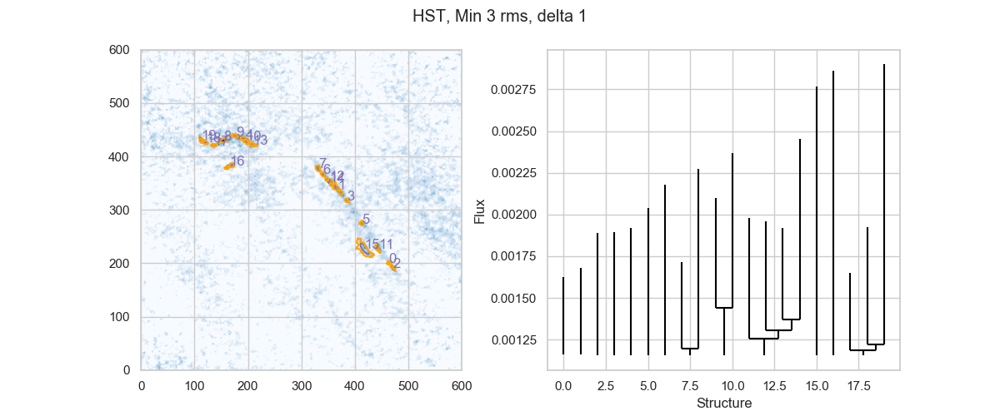

Number of clumps 20


In [9]:
min_value_test = 3.0*rms

d_M3D1_B1 = Dendrogram.compute(crop_data,min_value=min_value_test,min_delta=1.0*rms,min_npix=0,
                               is_independent=all_true((is_inside_box1,min_beam_size,min_2_chan)))
p_M3D1_B1 = d_M3D1_B1.plotter()
plot_to_compare(d_M3D1_B1,p_M3D1_B1,'HST, Min 3 rms, delta 1',im=alma_im)

d_M3D1_B2 = Dendrogram.compute(crop_data,min_value=min_value_test,min_delta=1.0*rms,min_npix=0,
                               is_independent=all_true((is_inside_box2,min_beam_size,min_2_chan)))
p_M3D1_B2 = d_M3D1_B2.plotter()
plot_to_compare(d_M3D1_B2,p_M3D1_B2,'HST, Min 3 rms, delta 1',im=alma_im)

d_M3D1_C = Dendrogram.compute(crop_data,min_value=min_value_test,min_delta=1.0*rms,min_npix=0,
                              is_independent=all_true((is_inside_hst,min_beam_size,min_2_chan)))
p_M3D1_C = d_M3D1_C.plotter()
plot_to_compare(d_M3D1_C,p_M3D1_C,'HST, Min 3 rms, delta 1',im=alma_im)
print('Number of clumps %d'%len(d_M3D1_C.leaves))

Make a catalogue

In [10]:
metadata = {'data_unit':u.Jy}

cat_M3D1_C = ppv_catalog(d_M3D1_C.leaves, metadata=metadata,verbose=False) 
print('Number of clumps %d'%len(cat_M3D1_C))

Number of clumps 20


## Decide on the best values for Fmin and Delta

Some functions to plot results

In [11]:
from normalize import APLpyNormalize

def make_rgb_image(im_r,im_g,im_b,min_p=(3.,3.,3.),mid_p=(70.,70.,70.),max_p=(99.5,99.5,99.5),stretch='arcsinh',plot=False):
    '''
    Takes 3 images and makes an rgb image.
    From David Carton.
    Parameters:
    -----------
    im_r: array
        red image
    im_g: array
        green image
    im_b: array
        blue image
    min_p: float
        percentile to calculate vmin of the image
    mid_p: float
        vmid
    max_p: float
        vmax
    Returns
    -----
    image (array)
    ''' 

    valid = np.isfinite(im_r)
    valid &= np.isfinite(im_g)
    valid &= np.isfinite(im_b)

    im_r[~valid] = 0.
    im_g[~valid] = 0.
    im_b[~valid] = 0.

    vmin, vmid, vmax = np.percentile(im_r, [min_p[0], mid_p[0], max_p[0]])
    norm = APLpyNormalize(stretch=stretch, vmin=vmin, vmax=vmax,
                      vmid=vmid)
    im_r = norm(im_r, clip=True)

    vmin, vmid, vmax = np.percentile(im_g, [min_p[1], mid_p[1], max_p[1]])
    norm = APLpyNormalize(stretch=stretch, vmin=vmin, vmax=vmax,
                      vmid=vmid)
    im_g = norm(im_g, clip=True)

    vmin, vmid, vmax = np.percentile(im_b, [min_p[2], mid_p[2], max_p[2]])
    norm = APLpyNormalize(stretch=stretch, vmin=vmin, vmax=vmax,
                      vmid=vmid)
    im_b = norm(im_b, clip=True)

    image = np.array([im_r, im_g, im_b])
    image = np.rollaxis(image, 0, 3)

    if plot:
        ratio = float(image.shape[0]) / float(image.shape[1])
        fig = plt.figure(figsize=(10.,10*ratio), frameon=False)
        ax = fig.add_axes([0,0,1,1])
        ax.set_axis_off()
        ax.imshow(image, interpolation='nearest', origin='lower')
    
    return image

In [12]:
def plot_alma(d,p):
    
    x = ax[1]
    x.imshow(mom0, origin='lower', vmax=0.1,vmin=-0.005)

    # Add the fiducial model
    for nb,leaf in enumerate(d_M3D1_C.leaves):
        p.plot_contour(x, structure=leaf, linewidths=1.5, colors='w')
        
    leaves = []
    for nb,leaf in enumerate(d.leaves):
        leaves.append(leaf.idx)
        p.plot_contour(x, structure=leaf, linewidths=1, colors='#5ca904',linestyles='--')
        s = PPVStatistic(leaf)

    x.add_artist(Ellipse(xy=(120,170), width=5.642E-05/8.333E-06, height=4.733E-05/8.333E-06, angle=-7.125E+01, facecolor='w'))
    x.hlines(y=110,xmin=100,xmax=100+(1/(8.333E-06 *3600)),color='w')
    x.annotate('1"',xy=(105, 115), color='w',fontsize=10)

    x.axis('off')
    x.set_ylim(80,490)
    x.set_xlim(50,530)
    
    
rgb_a521 = make_rgb_image(HST_red,HST_green,HST_blue,(5,5,5),(50,50,50),(99.3,99.3,99.9),stretch='linear')[600:1200,550:1150]


def plot_hst(d,p):
    
    x = ax[2]
    x.imshow(rgb_a521, origin='lower')

    for nb,leaf in enumerate(d.leaves):
        p.plot_contour(x, structure=leaf, linewidths=1, colors='#5ca904')
        
    x.axis('off')
    x.set_ylim(80,490)
    x.set_xlim(50,530)

    
def plot_muse(d,p):
    
    x = ax[3]
    cmap = plt.cm.RdBu_r
    cmap.set_bad('#516572',0.4)
    cax = x.imshow(mom1,origin='lower',cmap="RdBu_r",vmin=-100,vmax=100)
    x.contour(oii_vel,levels=np.arange(-100,100,20),cmap="RdBu_r",linewidths=0.8,inline=1)
    plt.colorbar(cax,ax=x,fraction=0.04)

    for nb,leaf in enumerate(d.leaves):
        p.plot_contour(x, structure=leaf, linewidths=0.8, colors='#5ca904')

    x.axis('off')
    x.set_ylim(80,490)
    x.set_xlim(50,530)

    
def plot_scatter(d_C,d_B1,d_B2):
    
    x = ax[0]
    sns.scatterplot([-1,-1],[-1,-1],marker='',ax=x)

    try:
        cat_B1 = ppv_catalog(d_B1.leaves, metadata,verbose=False)
        sns.scatterplot(cat_B1['flux'],cat_B1['radius'],marker='s',alpha=0.8, color=sns.xkcd_rgb['cornflower'],s=70,label='Empty region 1',ax=x)
        nb_B1 = len(cat_B1)
    except AttributeError:
        nb_B1 = np.nan
        print('No detections in Box 1') 
        
    try:
        cat_B2 = ppv_catalog(d_B2.leaves, metadata,verbose=False)
        sns.scatterplot(cat_B2['flux'],cat_B2['radius'],marker='s',alpha=0.8, color=sns.xkcd_rgb['olive green'],s=70,label='Empty region 2',ax=x)
        nb_B2 = len(cat_B2)
    except AttributeError:
        nb_B2 = np.nan
        print('No detections in Box 2')
    
    cat_C = ppv_catalog(d_C.leaves, metadata,verbose=False)
    nb_C = len(cat_C)
    sns.scatterplot(cat_C['flux'],cat_C['radius'],marker='o',color=sns.xkcd_rgb['dark pink'],alpha=0.8,s=70,label='Target region',ax=x)
        
    x.set_xlabel('Flux (Jy)')
    x.set_ylabel('Radius (arcsec)')
    #x.set_xlim(0,0.013)
    #x.set_ylim(0,0.225)
    
    print('Number of clumps %d'%nb_C)

    return (nb_C,np.nansum((nb_B1,nb_B2)))


Auxiliary function to determine to which multiple image each detections belongs to

In [13]:
def plot_dwcs_region(imagefile,dwcsfile,ra_ref,dec_ref,im_levels=None,plot=False,color=False):
    '''
    To plot the weird dwcs lenstool files in normal coordinates.
    Parameters:
    -----------
    imagefile: string
        image where the regions were drawn
    dwcsfile: string
        contour file 
    ra_ref,dec_ref: float,float
        at the begingin of the lenstool main file (.par), where it says 'reference 3'
    im_levels: float,float
        for plotting the image
    Returns:
    --------
        polygon
    '''
    im = fits.getdata(imagefile)
    w = WCS(fits.getheader(imagefile))

    ## Read dwcs file 
    nb,cont_x,cont_y = np.loadtxt(dwcsfile,unpack=True)
            
    vertices = []
    for (x_rel,y_rel) in zip(cont_x,cont_y):
            ## putting it back to normal coordinates...
            ra  = x_rel/ (-3600*np.cos(dec_ref/180*np.pi)) + ra_ref
            dec = y_rel / 3600 + dec_ref
            ## Put back in image coordinates
            x,y = w.wcs_world2pix(ra,dec,1)
            vertices.append((x,y))
            #plt.plot(x,y,'ro',markersize=6)

    poly = Polygon(vertices,True,alpha=0.2,color='r',joinstyle='round')
      
    if plot:
        plt.figure()
        ax = plt .subplot(111)
        if im_levels == None:
                plt.imshow(im,aspect='equal')
        else:
                plt.imshow(im,aspect='equal',vmin=im_levels[0],vmax=im_levels[1])
        ax.add_collection(poly,autolim=False)
        plt.show()
    
    # Make polygon into a mask
    y, x = np.mgrid[:im.shape[0], :im.shape[1]]
    points = np.transpose((x.ravel(), y.ravel()))
    poly_path = Path(vertices)
    mask = poly_path.contains_points(points).reshape(im.shape)
    
    poly.set_facecolor('None')
    poly.set_linewidth(1)
    poly.set_alpha(1)
    if color is not False:
        poly.set_edgecolor(color)
    
    return poly,mask

<IPython.core.display.Javascript object>


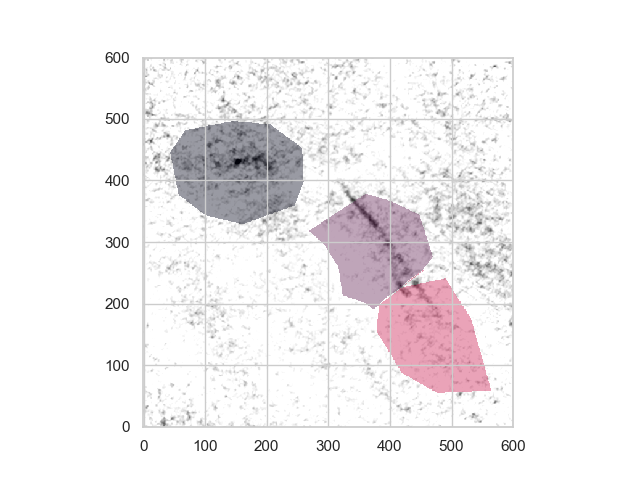

In [14]:
reghead_poly,reghead = plot_dwcs_region('../Data/Moments/a521_mom0.fits','../Data/LensigStuff/A521/complete.dwcs',73.528753, -10.223605,color='C1')
reg1_poly,reg1 = plot_dwcs_region('../Data/Moments/a521_mom0.fits','../Data/LensigStuff/A521/east.dwcs',73.528753, -10.223605,color='C2')
reg2_poly,reg2 = plot_dwcs_region('../Data/Moments/a521_mom0.fits','../Data/LensigStuff/A521/west.dwcs',73.528753, -10.223605,color='C3')

hst = fits.getdata('../Data/HST/A521_F606w.fits')

reghead = crop_image(reghead)
reg1 = crop_image(reg1)
reg2 = crop_image(reg2)

fullmask = reghead*1. + reg1*2. + reg2*3.
fullmask[np.where(fullmask==0)] = np.nan

plt.figure()
plt.imshow(alma_im,cmap='Greys',origin='lower',vmax=0.0005,vmin=0)
plt.imshow(fullmask,origin='lower',alpha=0.4)

In [15]:
def which_multiple_region(clump):
    
    complete = reghead_poly.contains_point((clump[0]+550,clump[1]+600))
    east = reg1_poly.contains_point((clump[0]+550,clump[1]+600))
    west = reg2_poly.contains_point((clump[0]+550,clump[1]+600))
    
    reg_idx = np.array((1,2,3))
    tests = np.array((complete,east,west))
    
    if np.any(tests):
        return reg_idx[np.array((complete,east,west))][0]
    
    else:
        return 0

Let's inspect the results and make sure we're getting the multiple image right.

<IPython.core.display.Javascript object>


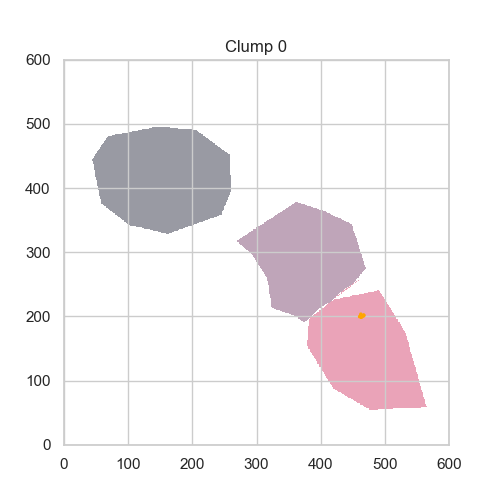

Multiple region 3


<IPython.core.display.Javascript object>


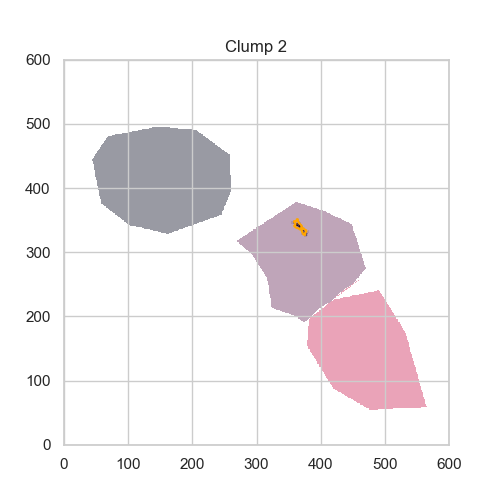

Multiple region 2


<IPython.core.display.Javascript object>


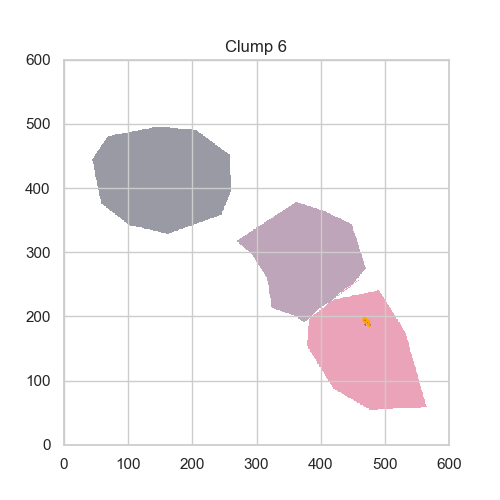

Multiple region 3


<IPython.core.display.Javascript object>


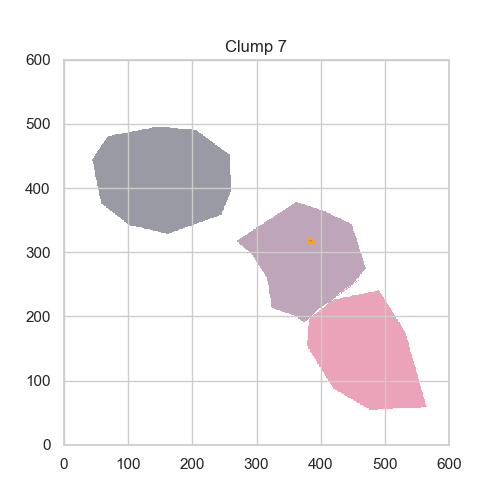

Multiple region 2


<IPython.core.display.Javascript object>


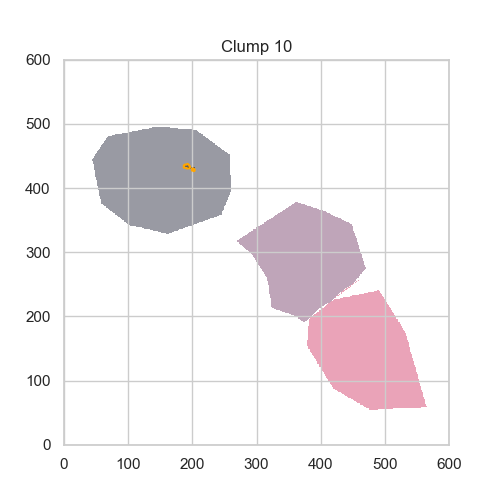

Multiple region 1


<IPython.core.display.Javascript object>


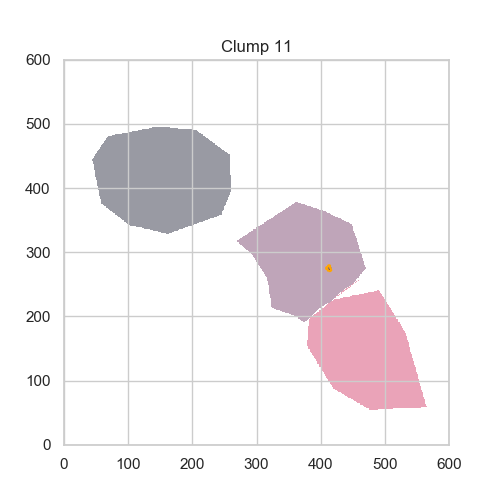

Multiple region 2


<IPython.core.display.Javascript object>


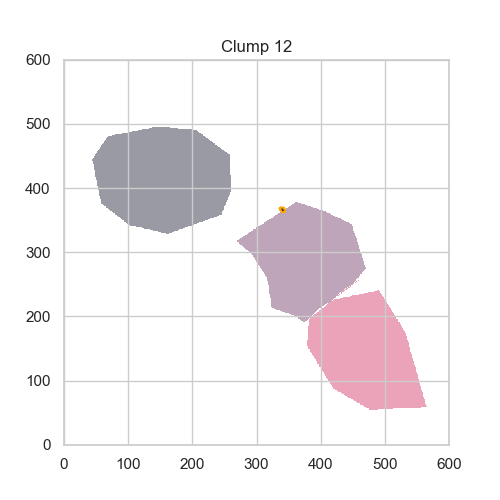

Multiple region 0


<IPython.core.display.Javascript object>


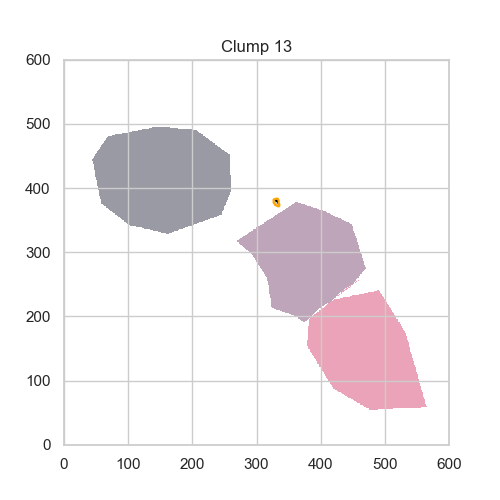

Multiple region 0


<IPython.core.display.Javascript object>


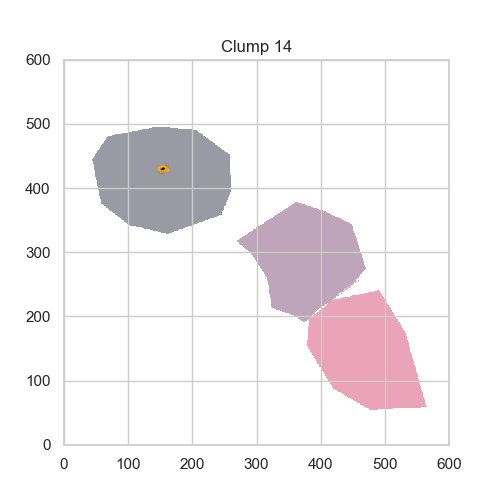

Multiple region 1


<IPython.core.display.Javascript object>


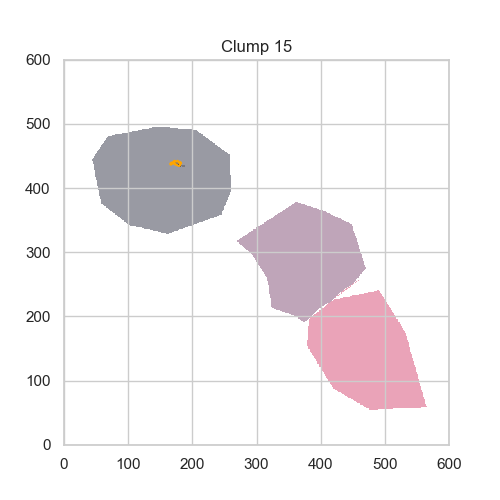

Multiple region 1


<IPython.core.display.Javascript object>


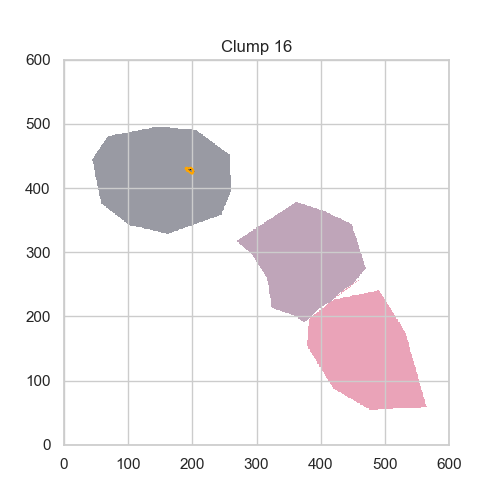

Multiple region 1


<IPython.core.display.Javascript object>


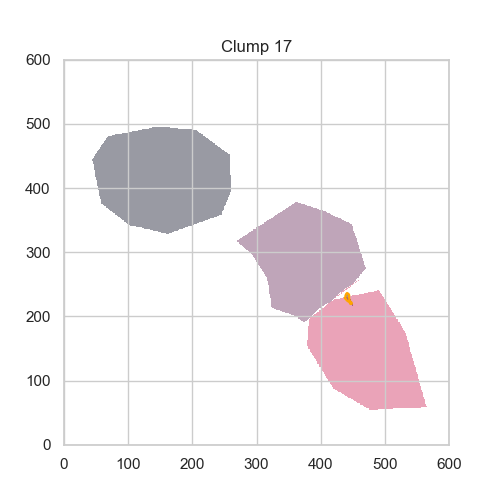

Multiple region 3


<IPython.core.display.Javascript object>


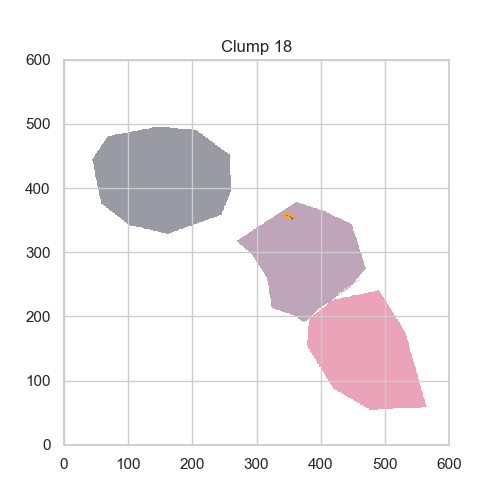

Multiple region 2


<IPython.core.display.Javascript object>


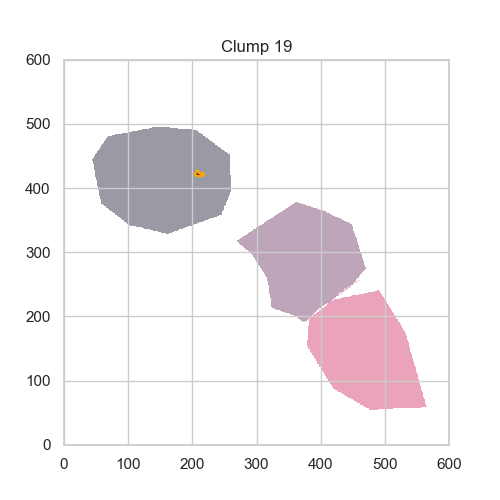

Multiple region 1


<IPython.core.display.Javascript object>


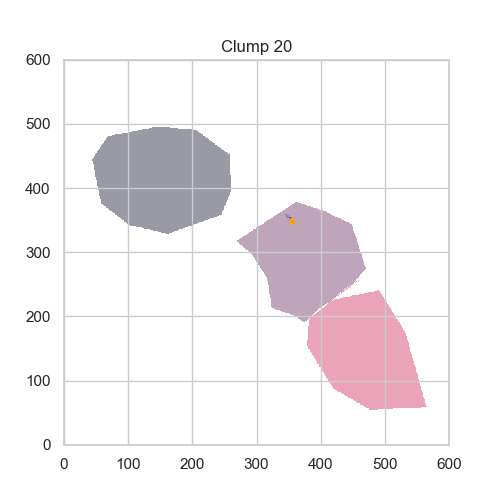

Multiple region 2


<IPython.core.display.Javascript object>


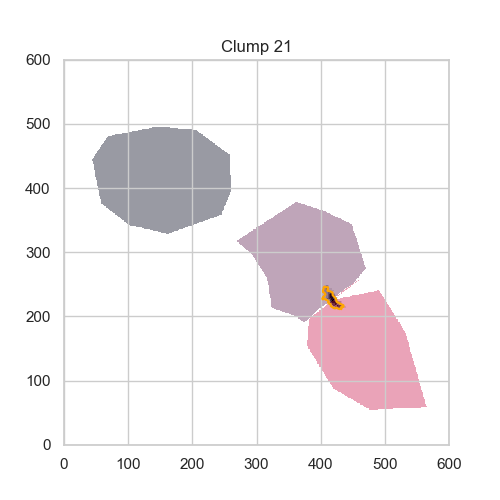

Multiple region 2


<IPython.core.display.Javascript object>


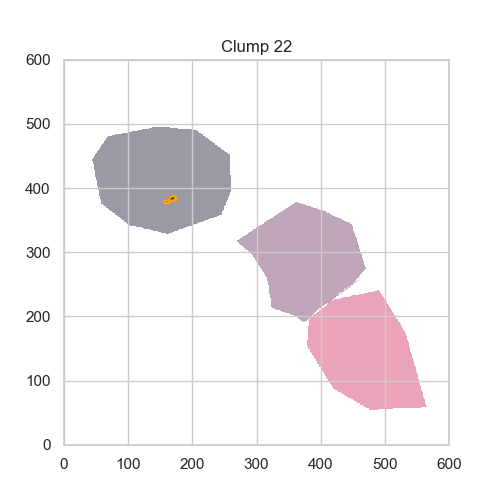

Multiple region 1


<IPython.core.display.Javascript object>


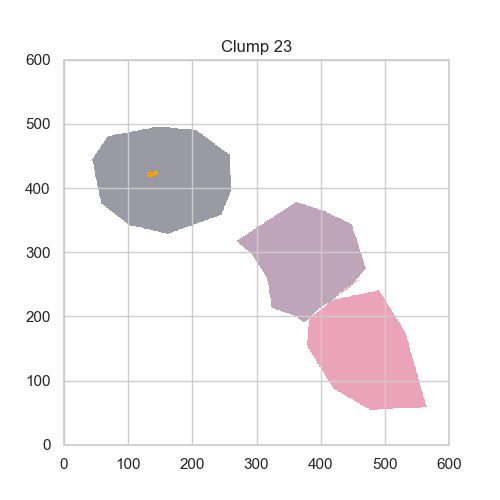

Multiple region 1


<IPython.core.display.Javascript object>


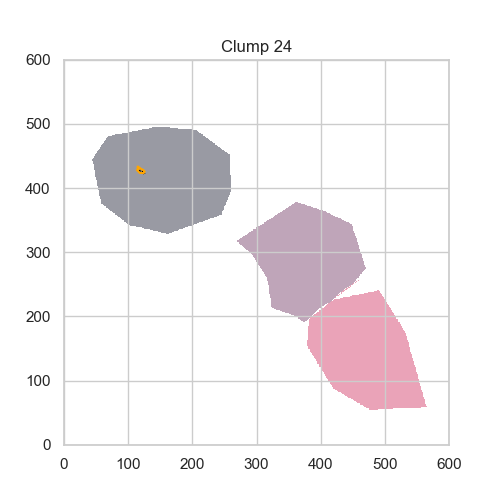

Multiple region 1


<IPython.core.display.Javascript object>


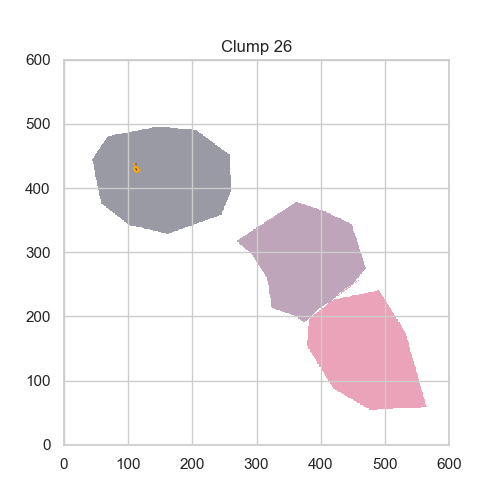

Multiple region 1


In [18]:
def test(d,p,c):
    
    cropped_header = wcs_alma.to_header()
    cropped_header['CRPIX1'] = cropped_header['CRPIX1'] - 550
    cropped_header['CRPIX2'] = cropped_header['CRPIX2'] - 600
    cat_test = ppv_catalog(d.leaves, metadata,verbose=False) 

    for nb,leaf in enumerate(d.leaves):
        mask = np.sum(leaf.get_mask(),axis=0)
        fig,ax = plt.subplots(1, 1, figsize=(5,5))
        ax.imshow(mask,origin='lower',cmap='Greys')
        ax.imshow(fullmask,origin='lower',alpha=0.4)
        p.plot_contour(ax, structure=leaf, lw=3, colors='orange')
        ax.set_title('Clump %d'%leaf.idx)
        clump = c[nb]
        print('Multiple region',which_multiple_region((clump['x_cen'],clump['y_cen']))) 
        
test(d_M3D1_C,p_M3D1_C,cat_M3D1_C)   

Looks fine.

Systematic plots of number of clumps found in target and empty areas

Make tables with number of clumps per region with each combination of parameters

First, we would like to know if a clump is in the complete image, or in the east or west multiple image.

In [16]:
sns.set_style('whitegrid')

nb_fmin = []
nb_delta = []
nb_clumps = []
nb_clumps_complete = []
nb_clumps_east = []
nb_clumps_west = []
nb_empty = []
nb_empty_B1 = []
nb_empty_B2 = []
    
fig, ax = plt.subplots(1,4,figsize=(12,4))
fig.subplots_adjust(top=0.98,bottom=0.15,left=0.08,right=0.95,wspace=0.01)

for fmin in np.arange(4.5,2.5,-0.1):

    for delta in [0.5,1.,1.5,2.0]:

        d_C = Dendrogram.compute(crop_data,min_value=fmin*rms,min_delta=delta*rms,min_npix=0,
                                 is_independent=all_true((is_inside_hst,min_beam_size,min_2_chan)))
        p_C = d_C.plotter()
        cat_c =  ppv_catalog(d_C.leaves, metadata,verbose=False) 
        mlt_image = [which_multiple_region((c['x_cen'],c['y_cen'])) for c in cat_c]

        d_B2 = Dendrogram.compute(crop_data,min_value=fmin*rms,min_delta=delta*rms,min_npix=0,
                                        is_independent=all_true((is_inside_box1,min_beam_size,min_2_chan)))

        d_B1 = Dendrogram.compute(crop_data,min_value=fmin*rms,min_delta=delta*rms,min_npix=0,
                                        is_independent=all_true((is_inside_box2,min_beam_size,min_2_chan)))

        plot_alma(d_C,p_C)
        plot_hst(d_C,p_C)
        plot_muse(d_C,p_C)
        nb_c,nb_e = plot_scatter(d_C,d_B1,d_B2)

        nb_fmin.append(fmin)
        nb_delta.append(delta)

        nb_clumps.append(nb_c)
        nb_clumps_complete.append(mlt_image.count(1))
        nb_clumps_east.append(mlt_image.count(2))
        nb_clumps_west.append(mlt_image.count(3))

        nb_empty.append(nb_e)
        nb_empty_B1.append(len(d_B1.leaves))
        nb_empty_B2.append(len(d_B2.leaves))

<IPython.core.display.Javascript object>

No detections in Box 1
No detections in Box 2
Number of clumps 4
No detections in Box 1
No detections in Box 2
Number of clumps 4
No detections in Box 1
No detections in Box 2
Number of clumps 4
No detections in Box 1
No detections in Box 2
Number of clumps 3
No detections in Box 1
No detections in Box 2
Number of clumps 5
No detections in Box 1
No detections in Box 2
Number of clumps 5
No detections in Box 1
No detections in Box 2
Number of clumps 5
No detections in Box 1
No detections in Box 2
Number of clumps 3
No detections in Box 1
No detections in Box 2
Number of clumps 5
No detections in Box 1
No detections in Box 2
Number of clumps 5
No detections in Box 1
No detections in Box 2
Number of clumps 5
No detections in Box 1
No detections in Box 2
Number of clumps 4
No detections in Box 1
No detections in Box 2
Number of clumps 6
No detections in Box 1
No detections in Box 2
Number of clumps 6
No detections in Box 1
No detections in Box 2
Number of clumps 5
No detections in Box 1
No

KeyboardInterrupt: 

Save table

In [30]:
## Save table
t = Table(data = [np.round(nb_fmin,2),nb_delta,nb_clumps,nb_clumps_complete,nb_clumps_east,nb_clumps_west,nb_empty,nb_empty_B1,nb_empty_B2], names=['Fmin','Delta','NbClumps','NbClumps_1','NbClumps_2','NbClumps_3','NbFalse','NbFalse1','NbFalse2'])
t.write('a521_fmin_delta_grid.tab',format='ascii.fixed_width_two_line')

Plot results

<IPython.core.display.Javascript object>


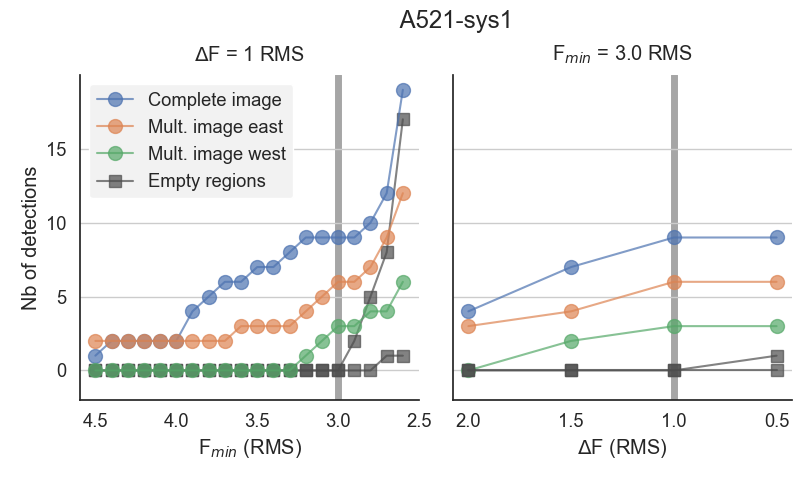

In [17]:
sns.set(font_scale=1.2)
sns.set_style('white')

fig, ax = plt.subplots(1,2,figsize=(8,5))
fig.subplots_adjust(top=0.85,bottom=0.2,left=0.1,right=0.99,wspace=0.1)
fig.suptitle('                 A521-sys1')

t = Table.read('a521_fmin_delta_grid.tab',format='ascii.fixed_width_two_line')

# Variation of Fmin, keeping Delta to 1
ax[0].set_title('$\Delta$F = 1 RMS',pad=10)
t_fmin = t[np.where(t['Delta']==1)]
ax[0].plot(t_fmin['Fmin'],t_fmin['NbClumps_1'],label='Complete image',marker='o',alpha=0.7,zorder=2,markersize=10)
ax[0].plot(t_fmin['Fmin'],t_fmin['NbClumps_2'],label='Mult. image east',marker='o',alpha=0.7,zorder=2,markersize=10)
ax[0].plot(t_fmin['Fmin'],t_fmin['NbClumps_3'],label='Mult. image west',marker='o',alpha=0.7,zorder=2,markersize=10)
ax[0].plot(t_fmin['Fmin'],t_fmin['NbFalse1'],label='Empty regions',marker='s',alpha=0.7,color='0.3',zorder=1,markersize=8)
ax[0].plot(t_fmin['Fmin'],t_fmin['NbFalse2'],marker='s',label='',alpha=0.7,color='0.3',zorder=1,markersize=8)

ax[0].invert_xaxis()
ax[0].set_ylabel('Nb of detections')
ax[0].set_xlabel('F$_{min}$ (RMS)')
ax[0].legend(loc=2,fancybox=True, framealpha=1,edgecolor='w',facecolor='0.95')
ax[0].set_ylim(-2,40)
ax[0].axvline(3.0,linewidth=5,color='0.5',alpha=0.7,zorder=0)

# Variation of Delta, keeping Fmin to 3.9 #3.3
ax[1].set_title('F$_{min}$ = 3.0 RMS',pad=10)
t_delta = t[np.where(t['Fmin']==3.0)]
t_delta.show_in_notebook()
ax[1].plot(t_delta['Delta'],t_delta['NbClumps_1'],marker='o',alpha=0.7,markersize=10)
ax[1].plot(t_delta['Delta'],t_delta['NbClumps_2'],marker='o',alpha=0.7,markersize=10)
ax[1].plot(t_delta['Delta'],t_delta['NbClumps_3'],marker='o',alpha=0.7,markersize=10)
ax[1].plot(t_delta['Delta'],t_delta['NbFalse1'],marker='s',alpha=0.7,color='0.3',markersize=8)
ax[1].plot(t_delta['Delta'],t_delta['NbFalse2'],marker='s',alpha=0.7,color='0.3',markersize=8)

ax[1].invert_xaxis()
ax[1].set_ylabel('')
ax[1].set_xlabel('$\\Delta$F (RMS)')
ax[1].axvline(1.0,linewidth=5,color='0.5',alpha=0.7,zorder=0)

# Set axes
sns.despine()

### Y axis is common ##
ax[0].set_ylim(-2,20)
ax[1].set_ylim(-2,20)
ax[0].yaxis.grid(True)
ax[1].yaxis.grid(True)
ax[0].set_yticks(range(0,20,5))
ax[1].set_yticks(range(0,20,5))
ax[1].set_yticklabels([''])

### X axis is common ##
ax[0].set_xticks(np.arange(4.5,2.0,-0.5))


fig.savefig('../Plots/a521_clump_detections.jpeg')

## Final selection

Let's write down our final gold and silver selections.

Then we will go through them and try to match the multiple images and eventually discard some of the detections

<IPython.core.display.Javascript object>


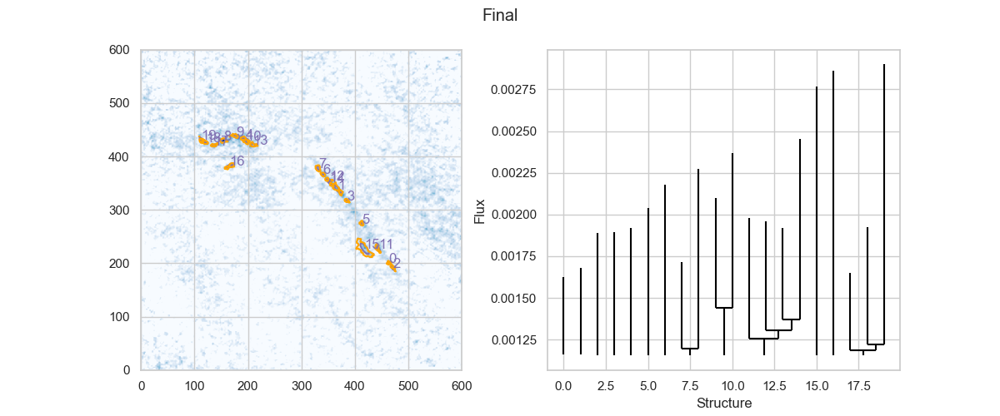

Number of leaves 20


In [18]:
d_final = Dendrogram.compute(crop_data,min_value=3.0*rms,min_delta=1*rms,min_npix=0,
                             is_independent=all_true((is_inside_hst,min_beam_size,min_2_chan)))
d_final.save_to('a521_dendrograms_fmin39_delta1.fits')

p_final = d_final.plotter()
plot_to_compare(d_final,p_final,'Final',im=alma_im)
print('Number of leaves %d'%len(d_final.leaves))

cat_final = ppv_catalog(d_final.leaves, metadata,verbose=False)

In [19]:
cat_final.show_in_notebook()

idx,_idx,area_ellipse,area_exact,flux,major_sigma,minor_sigma,position_angle,radius,v_cen,v_rms,x_cen,y_cen
,,pix2,pix2,Jy,pix,pix,deg,pix,pix,pix,pix,pix
0,0,17.665918468567448,42.0,0.06709122064057738,2.1761955758140106,1.8639762011007541,160.4226851342397,2.0140448759295477,16.56082717520817,0.6275775992478049,463.378941747133,201.01798160614814
1,2,82.04978149121034,278.0,0.9739126532804221,8.511881466254069,2.213369524962791,133.62163355344154,4.34049986032742,18.10974821328261,1.4661166338794163,368.1498459268194,338.12192579270754
2,6,28.774741922638725,76.0,0.1275444501079619,3.879333480254823,1.7031636790562654,130.75114212321412,2.570435737869545,17.157226248954906,0.8288520461341001,471.5914074813561,190.70560969852528
3,7,13.58208382794861,39.0,0.05606073990929872,2.5866496790223863,1.2056766679164392,148.84853289448435,1.7659737161325018,16.020678956967952,0.14230719485208465,385.084051288774,317.11937248343054
4,10,35.26000292161109,94.0,0.16282133560162038,4.959031586802903,1.6326291024029906,160.70230874582526,2.845392642211282,16.662544370920887,0.4728417573374126,195.11389200531758,432.2984980102127
5,11,14.503336649311057,52.0,0.12636415055021644,2.0242503677845747,1.6451509984133055,120.23353820233643,1.8248828766798415,18.66822567544068,0.8421450940944585,413.07934381996654,274.4201617186025
6,12,16.322495398504227,62.0,0.23837531358003616,2.3890306494793476,1.5687975330869721,139.91801155177023,1.9359507714227568,19.136039253767862,0.8838879959437165,340.48349253517273,366.581288905693
7,13,26.118113782432577,89.0,0.266234198352322,3.2436690249659716,1.8488741069247145,110.63436492301237,2.448904994419612,18.406204948559193,0.7319599014060572,331.57456415572227,378.364600213819
8,14,41.580575054875524,209.0,1.1810103707248345,3.931288764090536,2.4286090581820026,-136.84907045219902,3.089913186935744,22.836092451117633,2.856055370681863,154.0779252176338,429.52900973131153


In [20]:
dendro_idx_to_hidden_idx = {}
idx_to_dendro_idx = {}
for i in range(len(cat_final)):
    dendro_idx_to_hidden_idx[i] = d_final.leaves[i].idx

idx_to_dendro_idx = {}
for k,v in dendro_idx_to_hidden_idx.items():
    idx_to_dendro_idx[int(np.squeeze(np.where(cat_final['_idx'] == v)))] = k

### Noise selection

<IPython.core.display.Javascript object>


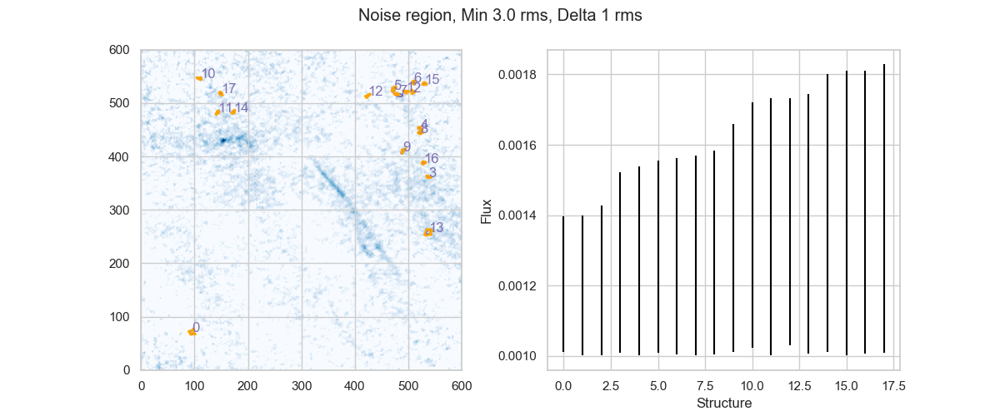

Number of leaves 18


In [21]:
d_noise = Dendrogram.compute(crop_data,min_value=2.6*rms,min_delta=1*rms,min_npix=0,is_independent=all_true((is_inside_box, min_beam_size,min_2_chan)))
p_noise = d_noise.plotter()
plot_to_compare(d_noise,p_noise,'Noise region, Min 3.0 rms, Delta 1 rms',im=alma_im)
cat_noise = ppv_catalog(d_noise.leaves, metadata=metadata,verbose=False) 
print('Number of leaves %d'%len(d_noise.leaves))

## Match Multiple Images

Save each one of the clumps separatly to try to match them 

In [22]:
def save_figure(d,p,save_dir):
    
    super_mask = np.zeros_like(alma_im)
    
    for nb,leaf in enumerate(d.leaves):
        mask = np.sum(leaf.get_mask(),axis=0)
        fig,ax = plt.subplots(1, 1, figsize=(5,5))
        ax.imshow(mask,origin='lower',cmap='Greys')
        plt.imshow(fullmask,origin='lower',alpha=0.7)
        p.plot_contour(ax, structure=leaf, lw=3, colors='orange')
        fits.writeto('%s/a521_clump_10kms_%d.fits'%(save_dir,nb),data=mask,header=wcs_alma.to_header(),overwrite=True)
        ax.set_title('Clump %d'%nb)
        super_mask[np.where(mask!=0)] = nb
    super_mask[np.where(super_mask==0)] = np.nan

    return super_mask

<IPython.core.display.Javascript object>


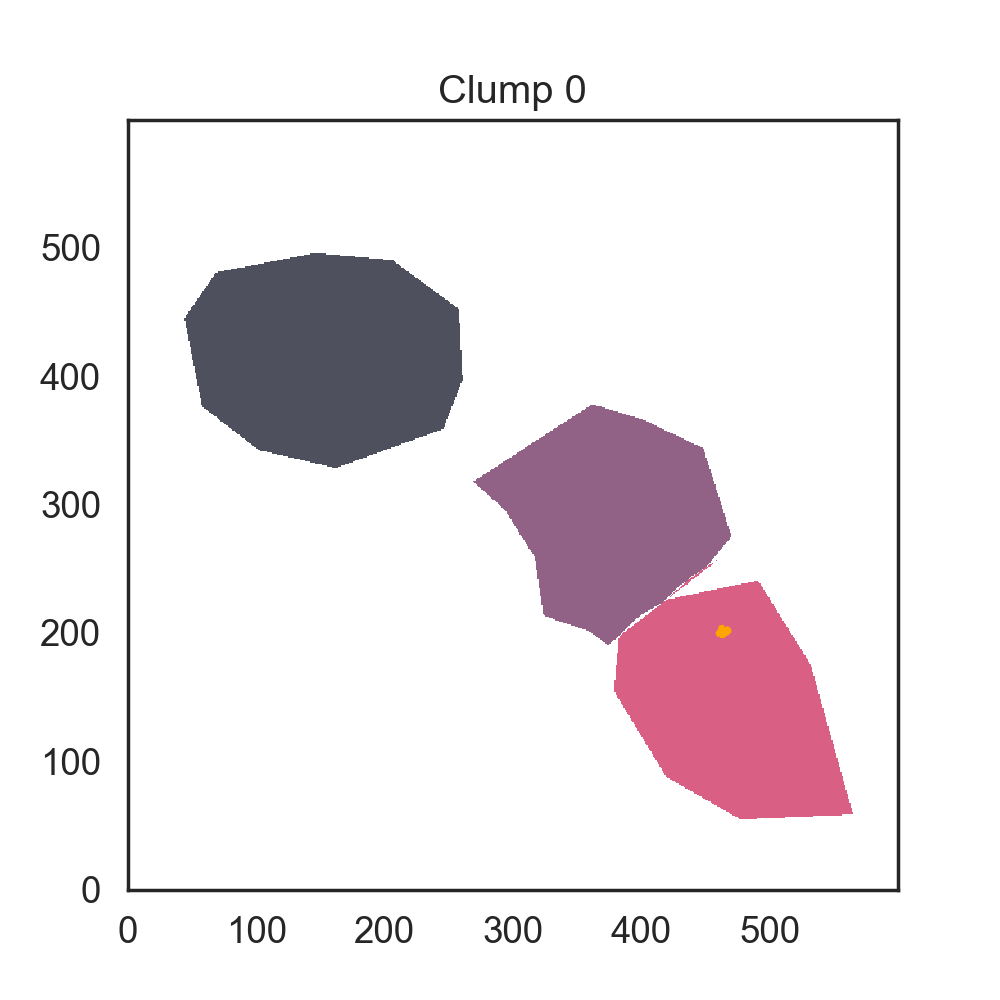

<IPython.core.display.Javascript object>


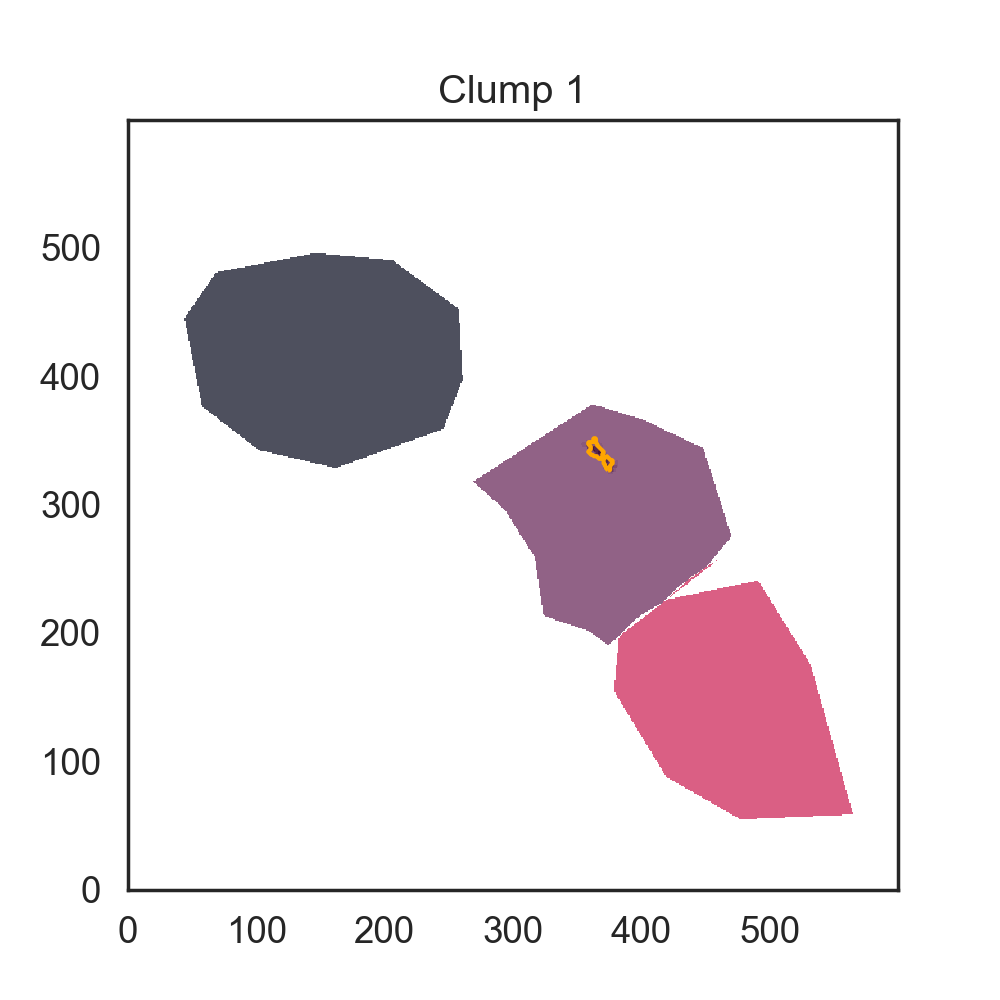

<IPython.core.display.Javascript object>


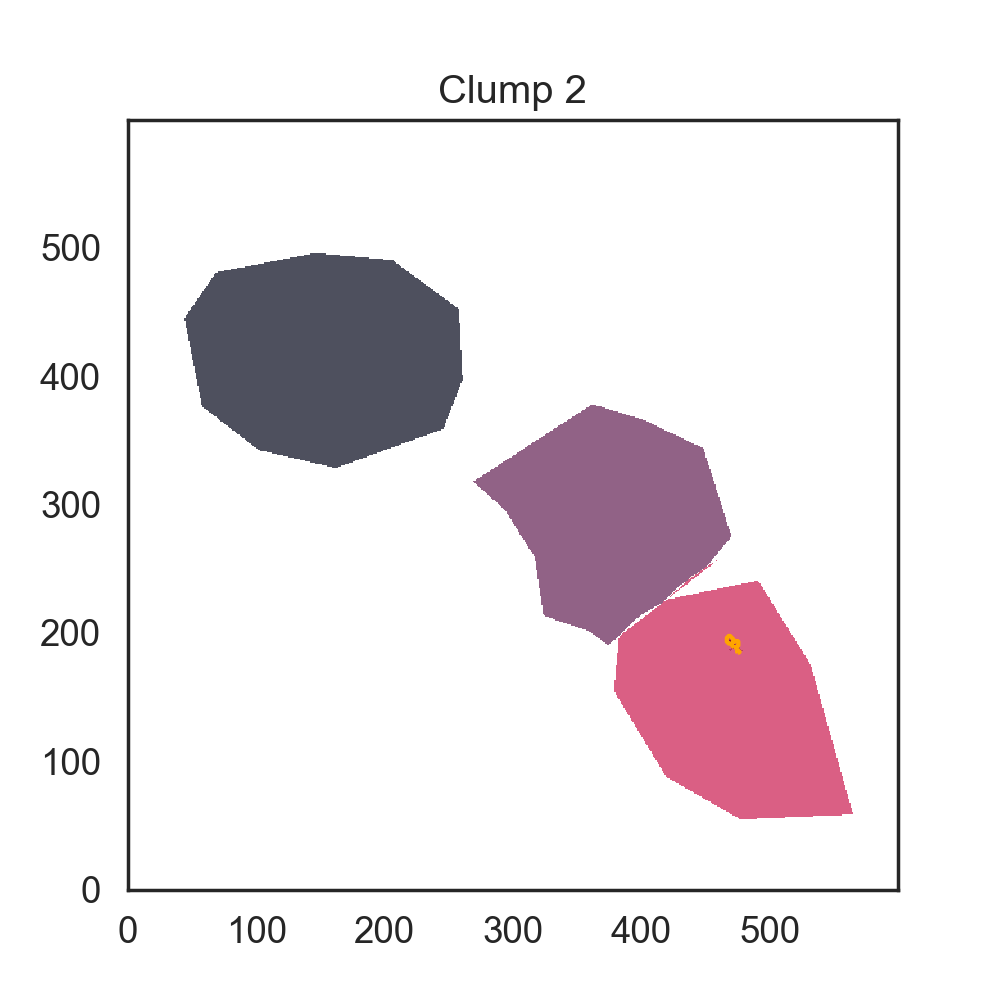

<IPython.core.display.Javascript object>


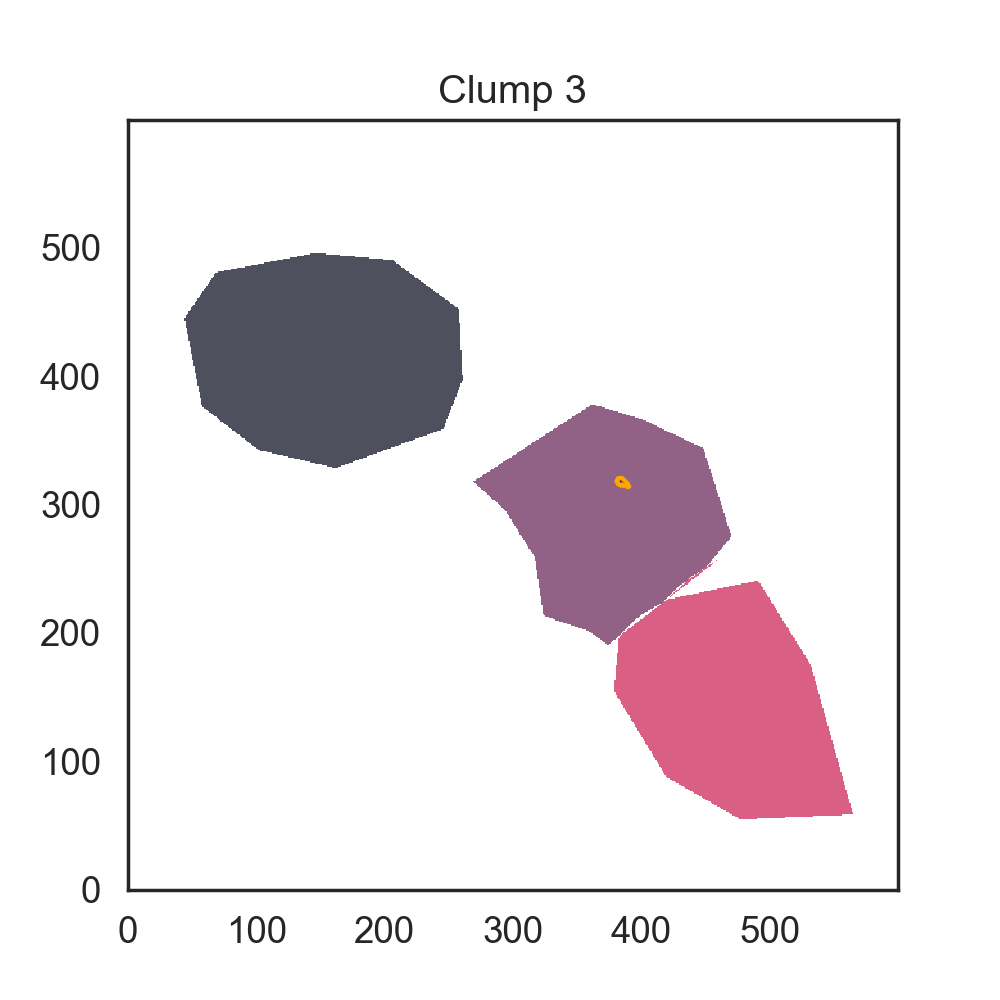

<IPython.core.display.Javascript object>


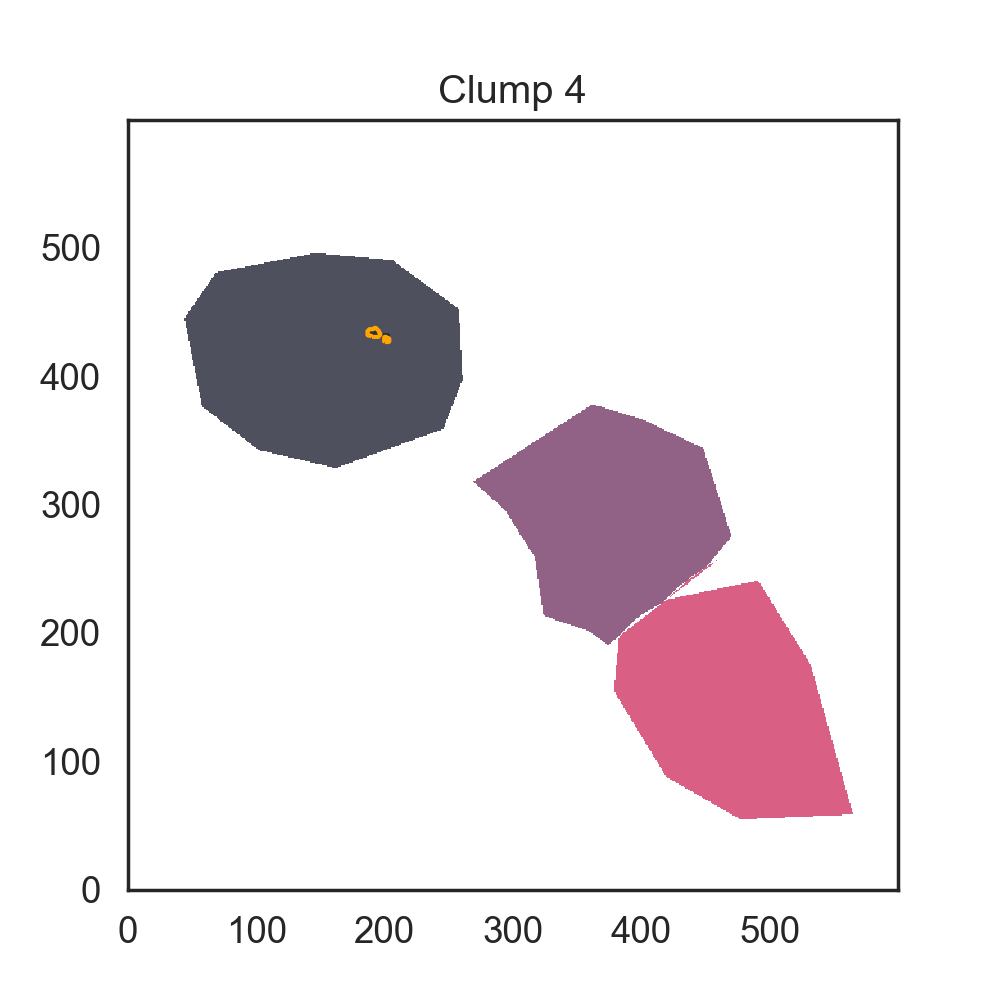

<IPython.core.display.Javascript object>


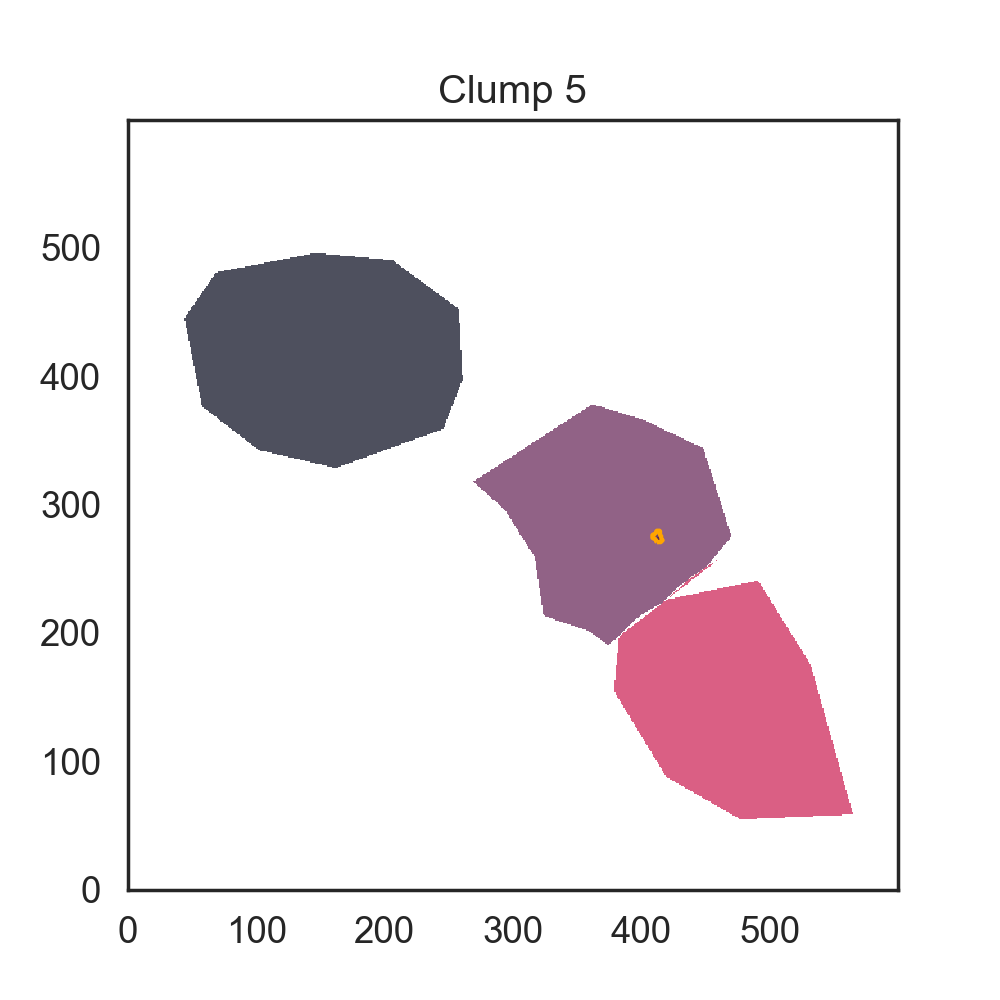

<IPython.core.display.Javascript object>


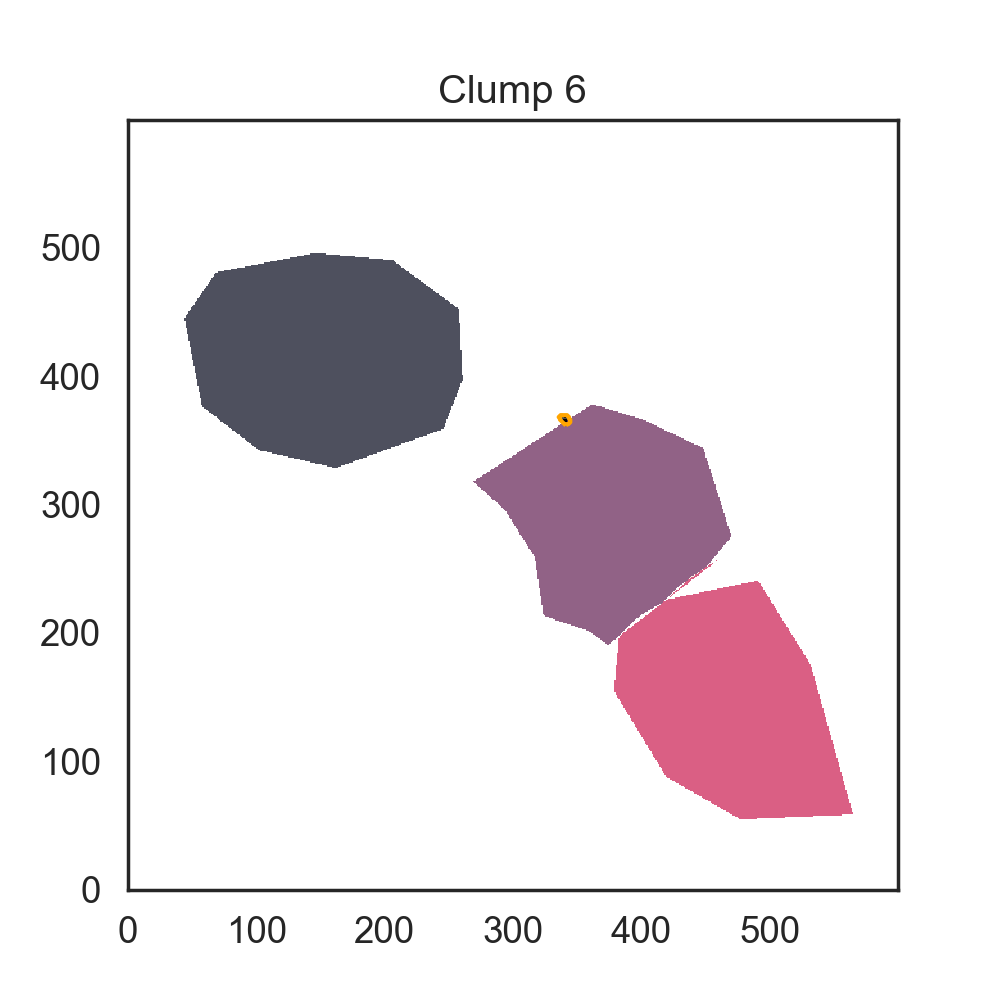

<IPython.core.display.Javascript object>


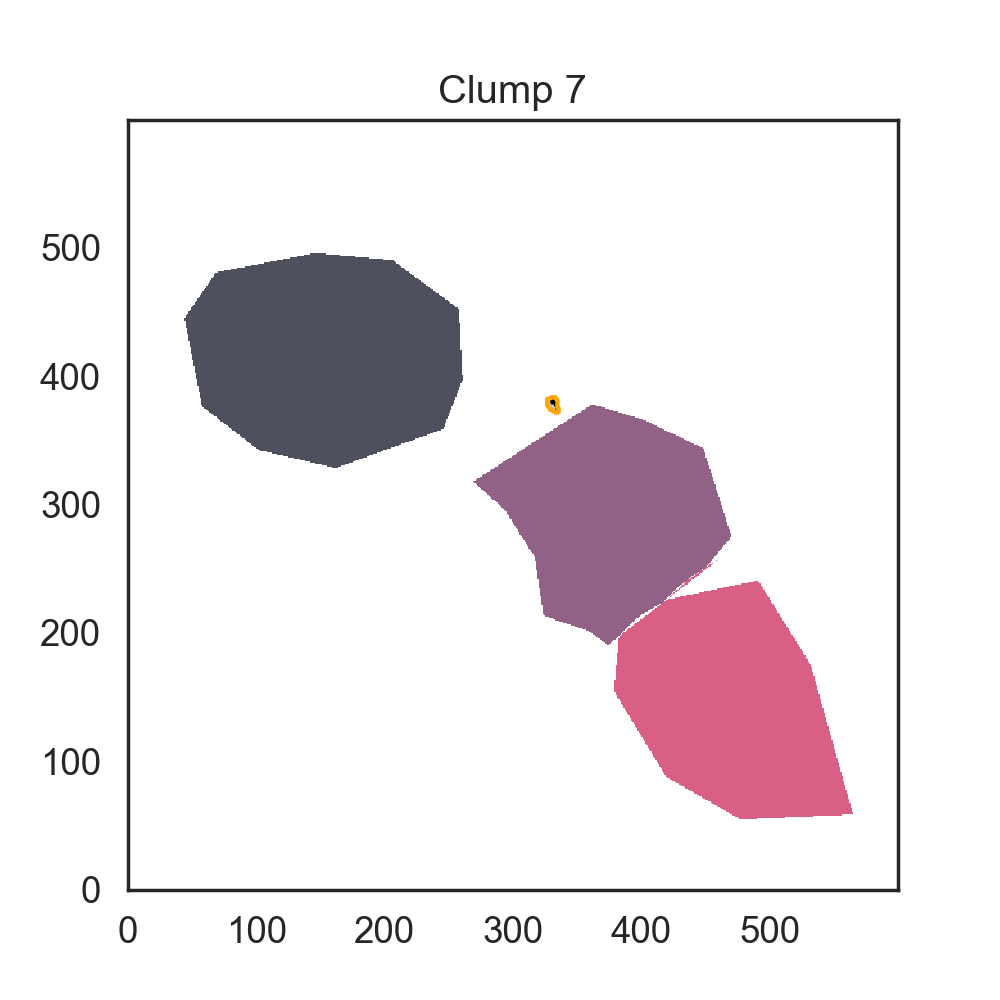

<IPython.core.display.Javascript object>


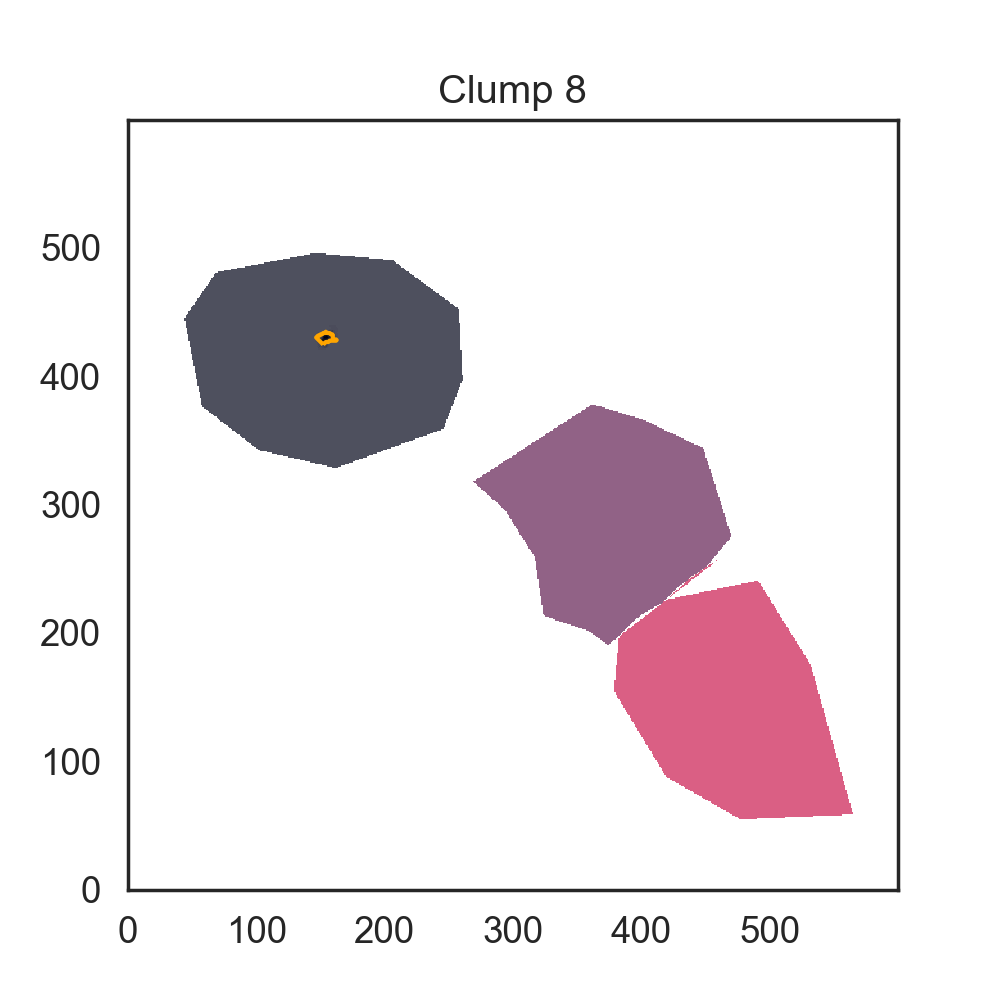

<IPython.core.display.Javascript object>


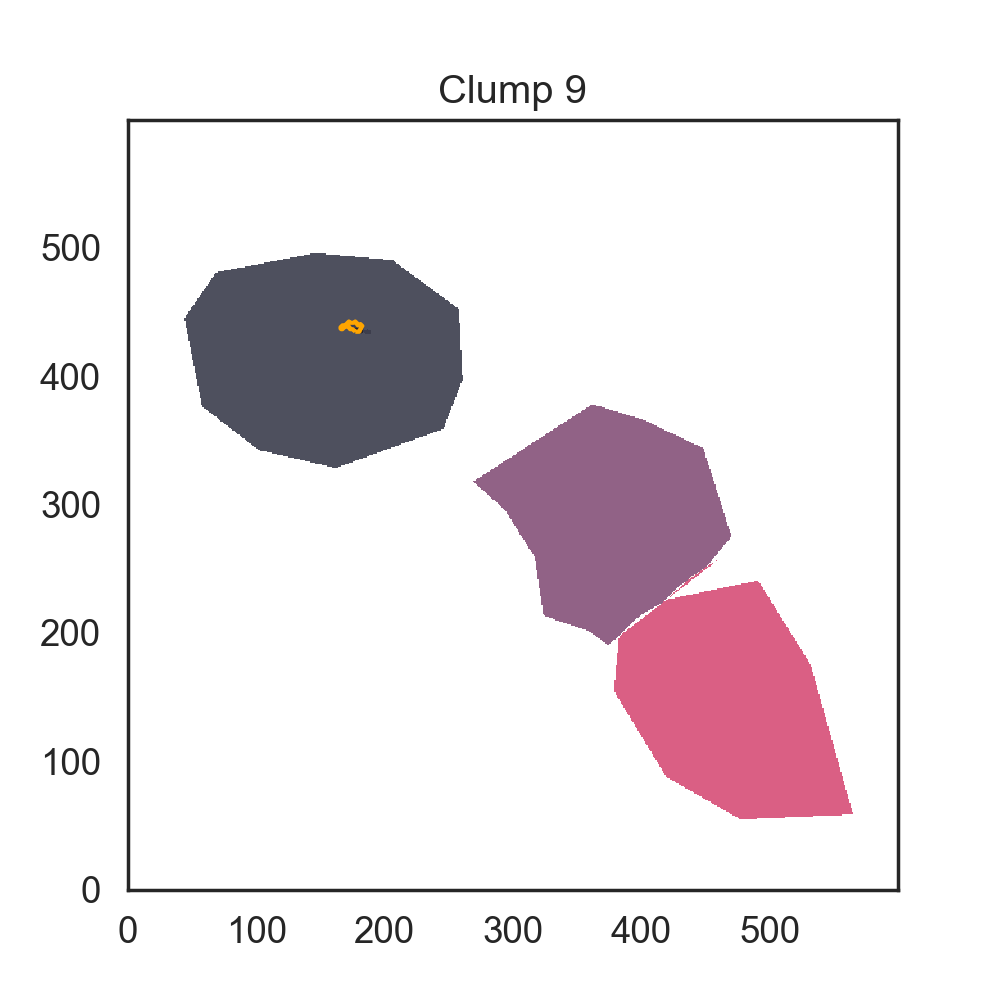

<IPython.core.display.Javascript object>


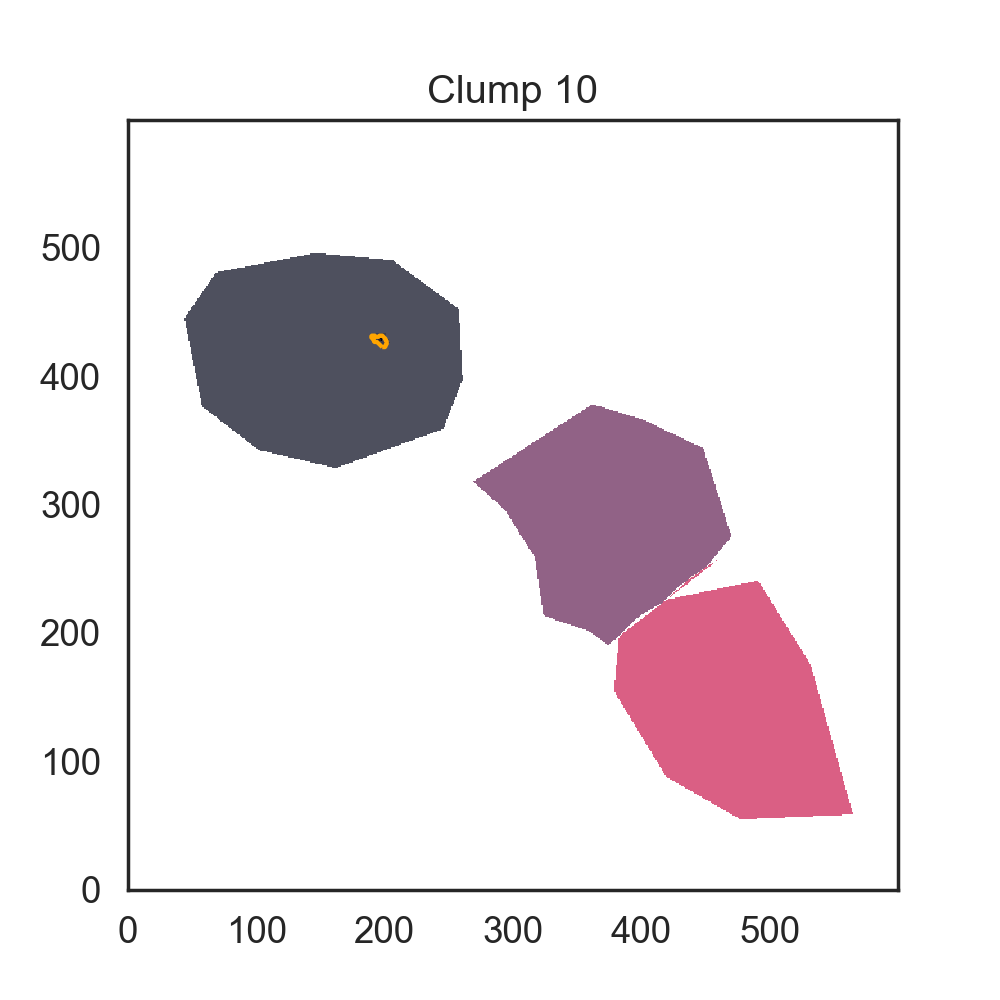

<IPython.core.display.Javascript object>


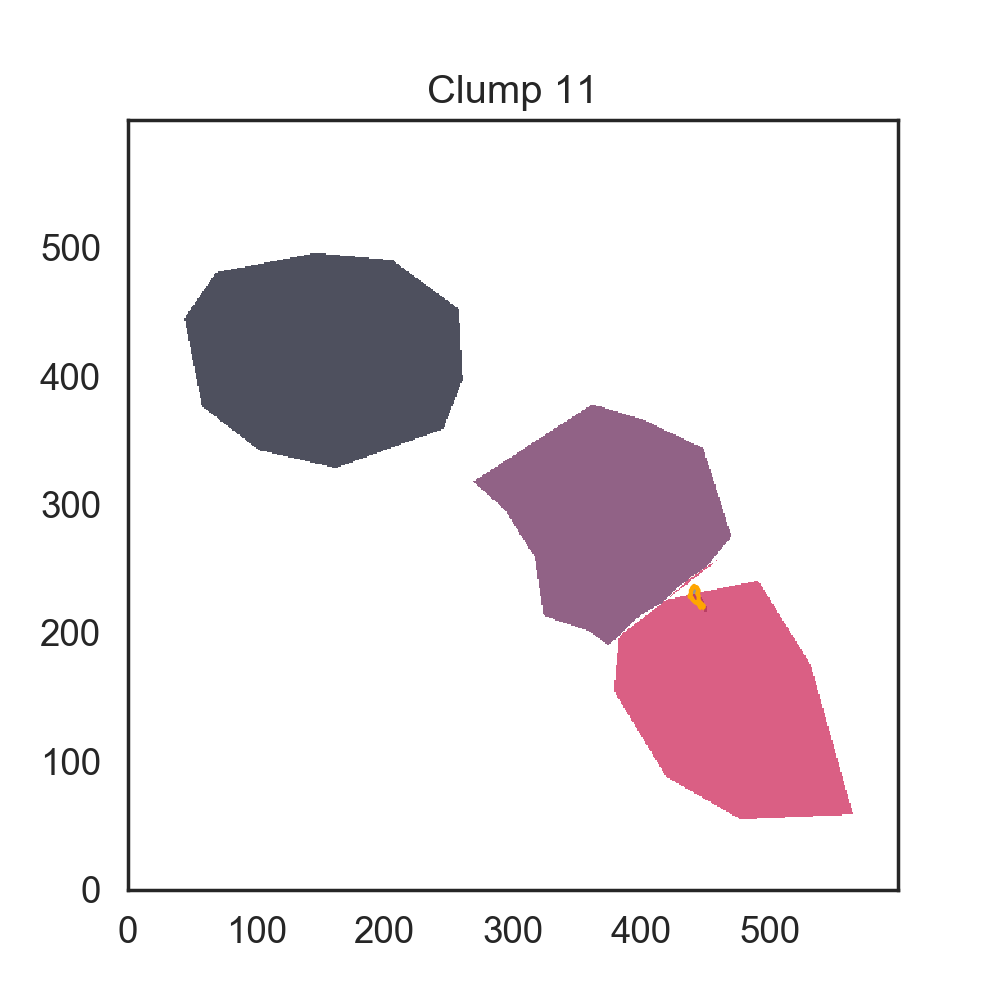

<IPython.core.display.Javascript object>


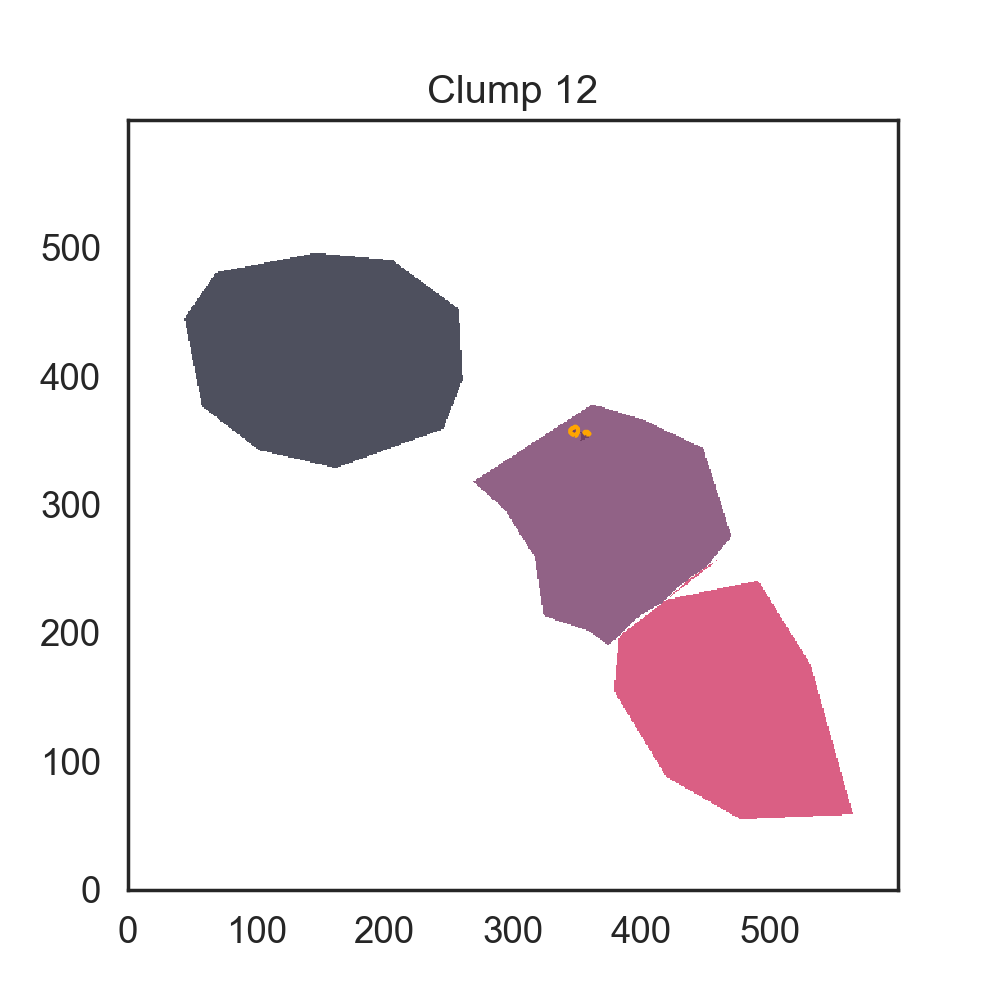

<IPython.core.display.Javascript object>


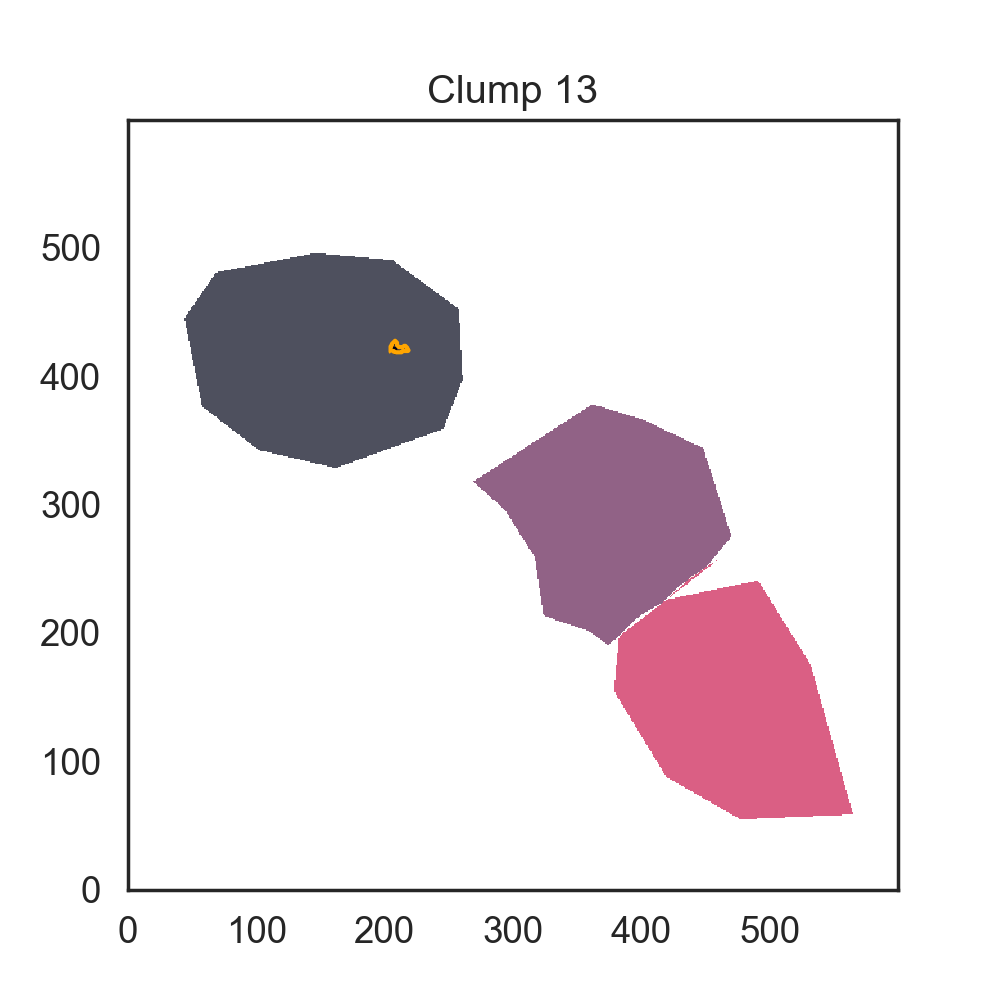

<IPython.core.display.Javascript object>


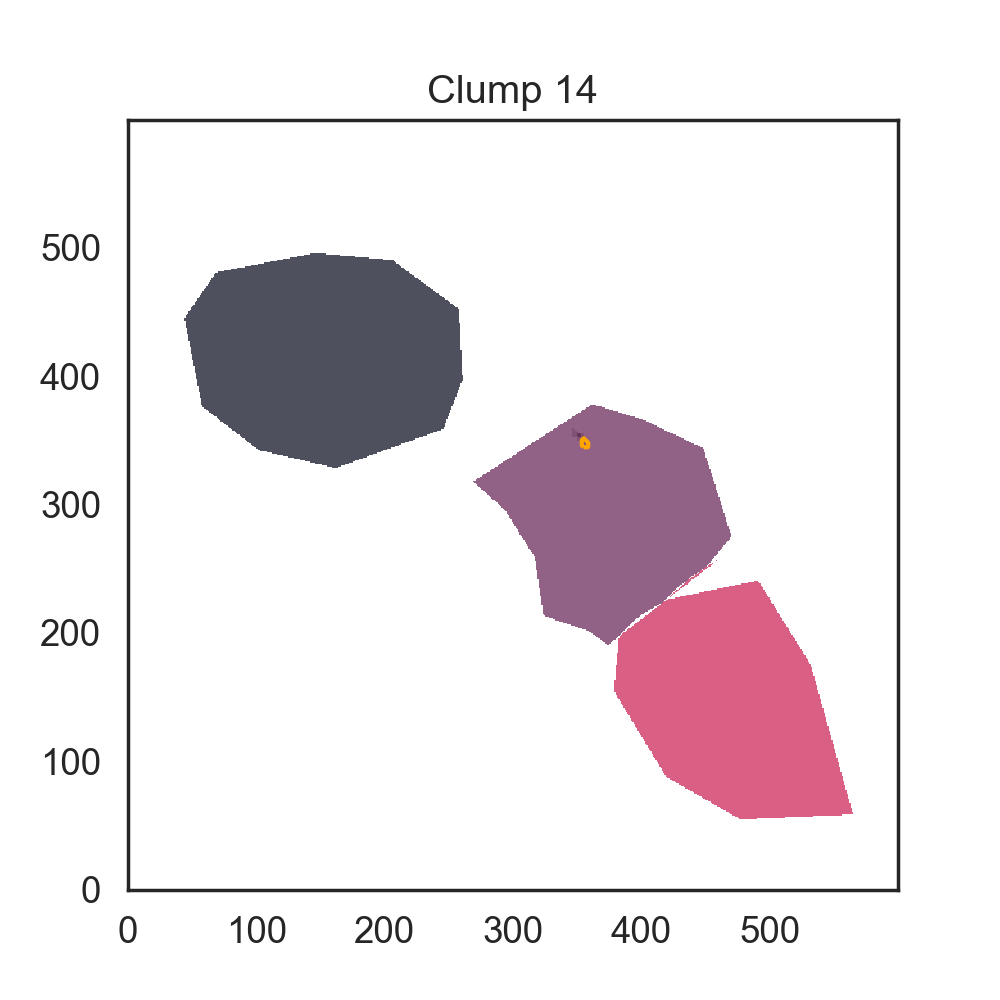

<IPython.core.display.Javascript object>


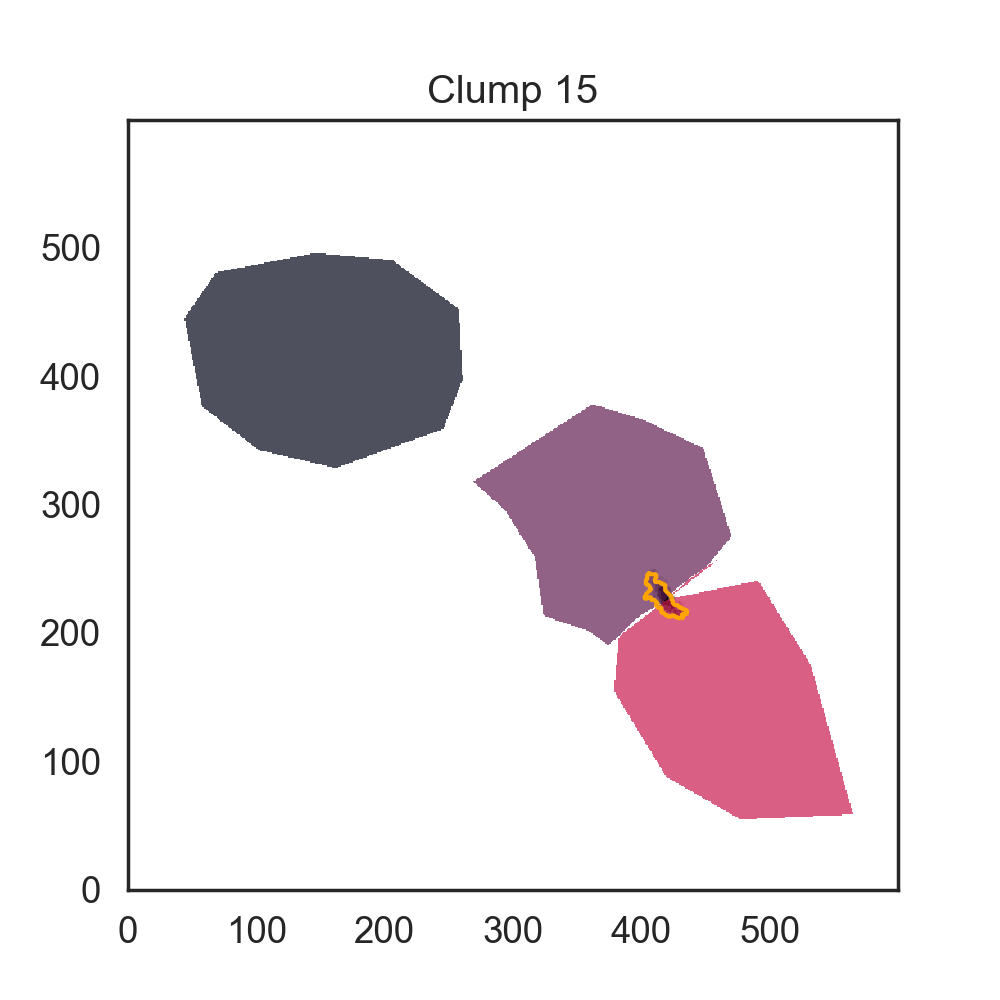

<IPython.core.display.Javascript object>


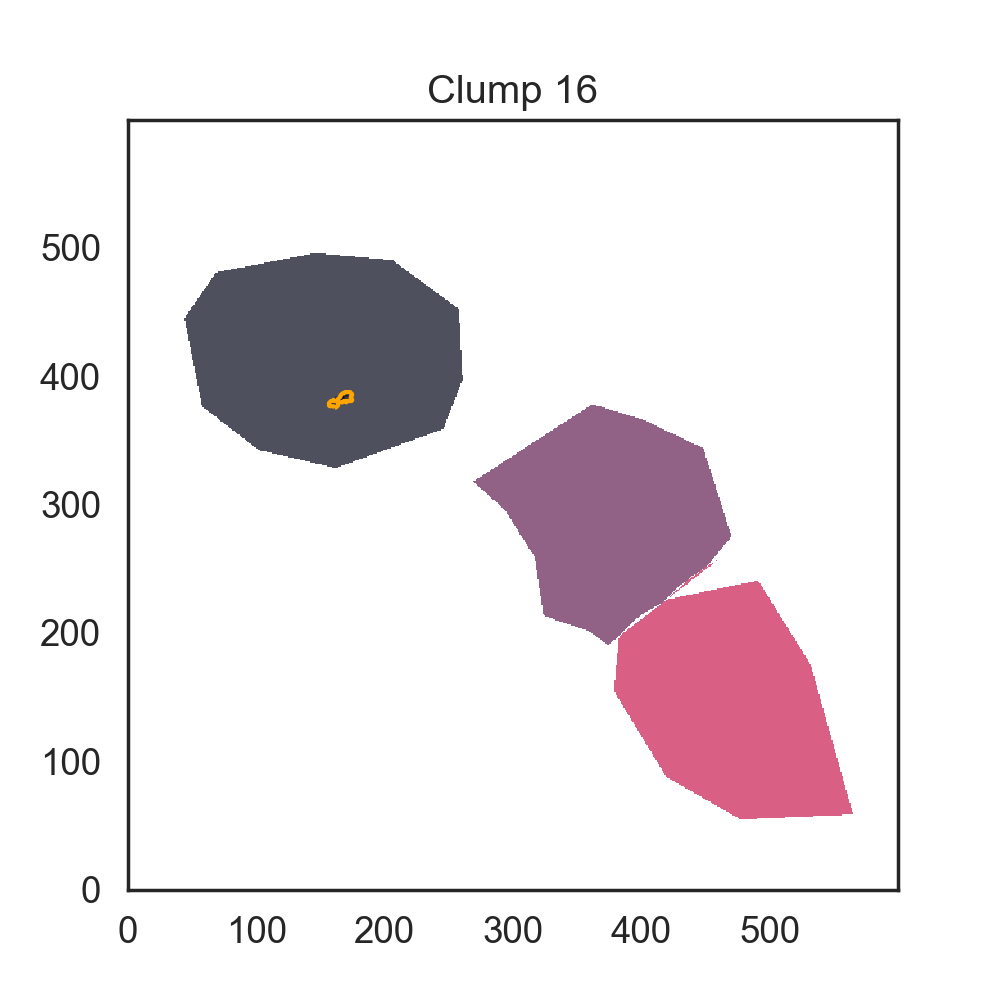

<IPython.core.display.Javascript object>


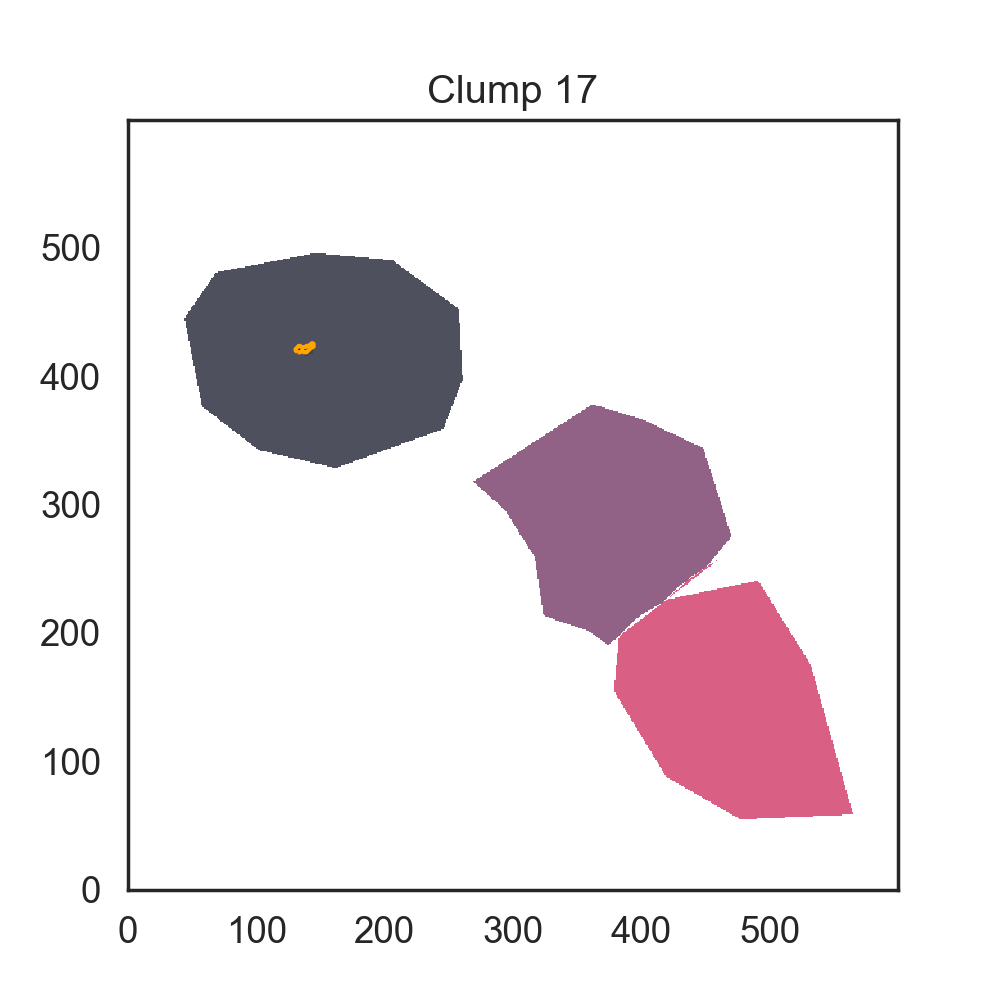

<IPython.core.display.Javascript object>


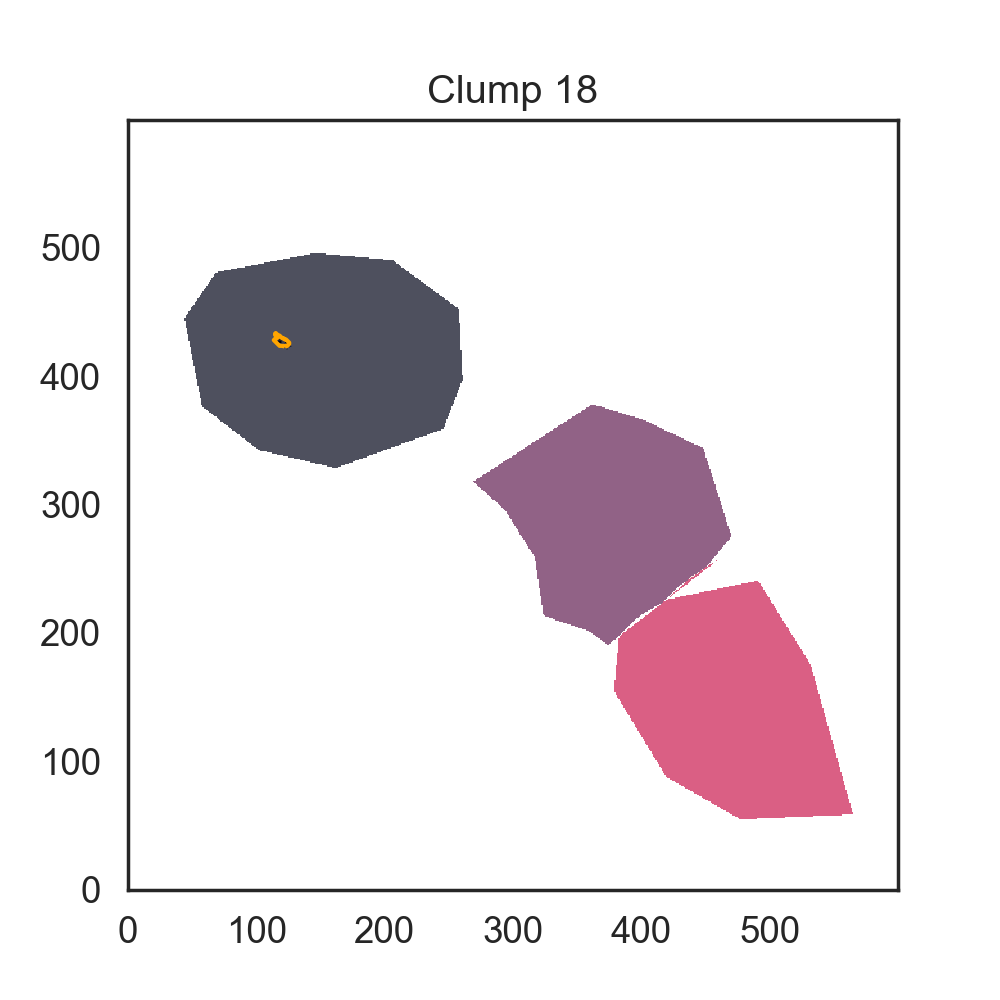

<IPython.core.display.Javascript object>


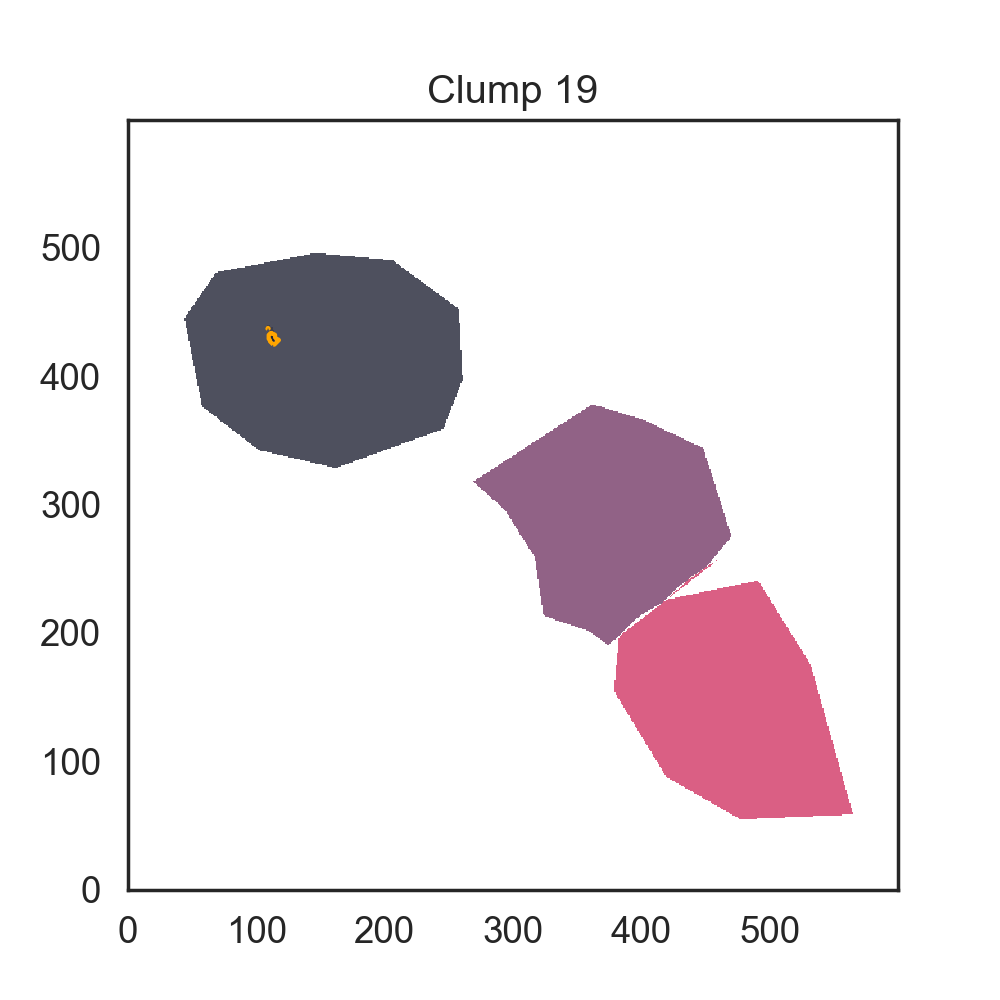

In [42]:
super_mask_gold = save_figure(d_final,p_final,'clumps_a521/')

fits.writeto('clumps_a521/a521_all_clumps.fits',data=super_mask_gold,header=wcs_alma.to_header(),overwrite=True)

Add to the catalogue the information about in which multiple image each clump is 

In [23]:
mlt_image = [which_multiple_region((c['x_cen'],c['y_cen'])) for c in cat_final]

#Fill in manually the ones that were hard to identify
for i,m in enumerate(mlt_image):
    if m==0: print('idx:%d mult: %d'%(i,m))

# They are all from the east multiple image
mlt_image[6] = 2
mlt_image[7] = 2

# and this one is tricky, so let's keep a note to split it in a bit
mlt_image[15] = 4

idx:6 mult: 0
idx:7 mult: 0


In [24]:
# Save it to catalogue
col_multiple = Column(name='mlt_region', data=np.array(mlt_image))
cat_final.add_column(col_multiple)

cat_final.show_in_notebook()

idx,_idx,area_ellipse,area_exact,flux,major_sigma,minor_sigma,position_angle,radius,v_cen,v_rms,x_cen,y_cen,mlt_region
,,pix2,pix2,Jy,pix,pix,deg,pix,pix,pix,pix,pix,
0,0,17.665918468567448,42.0,0.06709122064057738,2.1761955758140106,1.8639762011007541,160.4226851342397,2.0140448759295477,16.56082717520817,0.6275775992478049,463.378941747133,201.01798160614814,3
1,2,82.04978149121034,278.0,0.9739126532804221,8.511881466254069,2.213369524962791,133.62163355344154,4.34049986032742,18.10974821328261,1.4661166338794163,368.1498459268194,338.12192579270754,2
2,6,28.774741922638725,76.0,0.1275444501079619,3.879333480254823,1.7031636790562654,130.75114212321412,2.570435737869545,17.157226248954906,0.8288520461341001,471.5914074813561,190.70560969852528,3
3,7,13.58208382794861,39.0,0.05606073990929872,2.5866496790223863,1.2056766679164392,148.84853289448435,1.7659737161325018,16.020678956967952,0.14230719485208465,385.084051288774,317.11937248343054,2
4,10,35.26000292161109,94.0,0.16282133560162038,4.959031586802903,1.6326291024029906,160.70230874582526,2.845392642211282,16.662544370920887,0.4728417573374126,195.11389200531758,432.2984980102127,1
5,11,14.503336649311057,52.0,0.12636415055021644,2.0242503677845747,1.6451509984133055,120.23353820233643,1.8248828766798415,18.66822567544068,0.8421450940944585,413.07934381996654,274.4201617186025,2
6,12,16.322495398504227,62.0,0.23837531358003616,2.3890306494793476,1.5687975330869721,139.91801155177023,1.9359507714227568,19.136039253767862,0.8838879959437165,340.48349253517273,366.581288905693,2
7,13,26.118113782432577,89.0,0.266234198352322,3.2436690249659716,1.8488741069247145,110.63436492301237,2.448904994419612,18.406204948559193,0.7319599014060572,331.57456415572227,378.364600213819,2
8,14,41.580575054875524,209.0,1.1810103707248345,3.931288764090536,2.4286090581820026,-136.84907045219902,3.089913186935744,22.836092451117633,2.856055370681863,154.0779252176338,429.52900973131153,1


In [24]:
cat_final.add_index('_idx')
print('Number of clumps identified in the complete region',len(cat_final[np.where(cat_final['mlt_region']==1)]))
print('Number of clumps identified in the east region',len(cat_final[np.where(cat_final['mlt_region']==2)]))
print('Number of clumps identified in the west region',len(cat_final[np.where(cat_final['mlt_region']==3)]))

Number of clumps identified in the complete region 9
Number of clumps identified in the east region 7
Number of clumps identified in the west region 3


## Match Clumps

We do this by taking all the clumps of one of the multiple images (this case the complete image), lens it to source plane and then lense it back to image plane to obtain all the multiple images of that clump

In [25]:
print('idx of clumps in the complete',np.where(cat_final['mlt_region']==1))

idx of clumps in the complete (array([ 4,  8,  9, 10, 13, 16, 17, 18, 19]),)


<IPython.core.display.Javascript object>


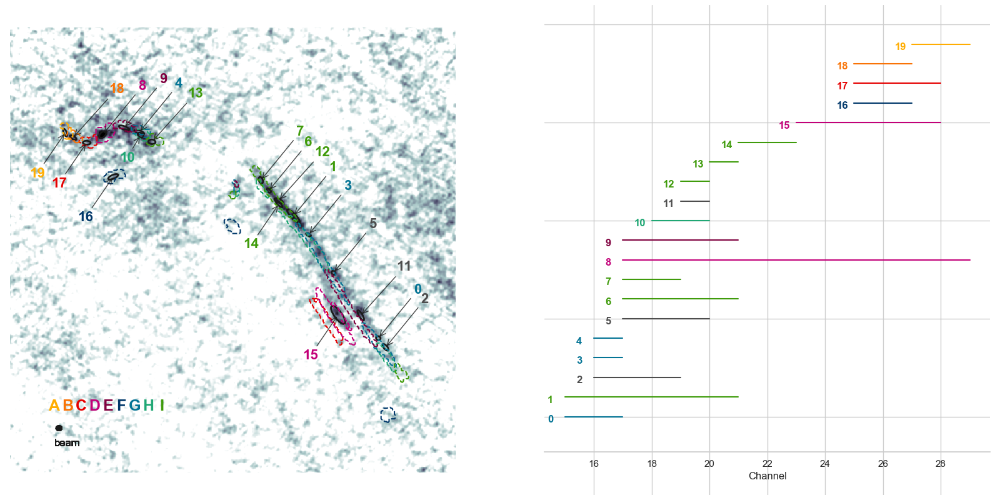

../Data/LensigStuff/A521/clumps_masks/simul_a521_clump_10kms_10.fits
../Data/LensigStuff/A521/clumps_masks/simul_a521_clump_10kms_16.fits
../Data/LensigStuff/A521/clumps_masks/simul_a521_clump_10kms_17.fits
../Data/LensigStuff/A521/clumps_masks/simul_a521_clump_10kms_4.fits
../Data/LensigStuff/A521/clumps_masks/simul_a521_clump_10kms_18.fits
../Data/LensigStuff/A521/clumps_masks/simul_a521_clump_10kms_8.fits
../Data/LensigStuff/A521/clumps_masks/simul_a521_clump_10kms_9.fits
../Data/LensigStuff/A521/clumps_masks/simul_a521_clump_10kms_19.fits
../Data/LensigStuff/A521/clumps_masks/simul_a521_clump_10kms_13.fits


In [26]:
import glob
    
fig, ax = plt.subplots(1,2,figsize=(16,8))
fig.subplots_adjust(top=0.99,bottom=0.01,left=0.01,right=0.99)

ax[0].imshow(alma_im,origin='lower',cmap='bone_r',vmin=0,vmax=0.0005)
    
color_clump = {19:'#ffad01',
               18:'#f97306',
               17:'#e50000',
               8:'#c20078', 15:'#c20078',
               9:'#80013f',
               4 :'#047495',0:'#047495',3:'#047495',
               10:'#1fa774',
               13:'#3f9b0b', 7:'#3f9b0b',6:'#3f9b0b',12:'#3f9b0b',14:'#3f9b0b',1:'#3f9b0b',
               16:'#01386a'}
                

for i,sp_file in enumerate(glob.glob('../Data/LensigStuff/A521/clumps_masks/simul_a521_clump_10kms*.fits')):
    print(sp_file)
    clump_nb = int(sp_file.split('../Data/LensigStuff/A521/clumps_masks/simul_a521_clump_10kms_')[1].split('.fits')[0])
    im,_ = reproject_interp(sp_file,alma_header)
    im = crop_image(im)
    ax[0].contour(im,origin='lower',levels=[0],colors=color_clump.get(clump_nb,'0.3'),linestyles='--')


sign ={19:-1,17:-1,10:-0.6,16:-1,14:-1,15:-1}

for clump in cat_final:
    ax[0].annotate(str(clump.index), 
                 xy=(clump['x_cen'], clump['y_cen']),
                 xytext=(clump['x_cen']+40*sign.get(clump.index,1), clump['y_cen']+50*sign.get(clump.index,1)), 
                 arrowprops=dict(arrowstyle='->',color='0.1',alpha=0.8),
                 fontsize=16,fontweight='bold',color=color_clump.get(clump.index,'0.3'))
    
    leaf = d_final.leaves[clump.index]
    s = PPVStatistic(leaf)
    ax[0].add_patch(s.to_mpl_ellipse(facecolor='None',edgecolor='k',linewidth=2))
    
    
    ax[0].add_artist(Ellipse(xy=(105,100), width=5.641585836808E-05/8.333E-06, height=4.732591824399E-05/8.333E-06, angle=0, color='k'))
    ax[0].annotate('beam',(100,80),color='k',fontsize=12)

    ax[0].set_xlim(50,550)
    ax[0].set_ylim(50,550)
    ax[0].axis('off')
    
name_clump = {'A':'#ffad01',
              'B':'#f97306',
              'C':'#e50000',
              'D':'#c20078',
              'E':'#80013f',
              'F':'#01386a',
              'G':'#047495',
              'H':'#1fa774',
              'I':'#3f9b0b'}

for d,(k,i) in enumerate(name_clump.items()):
    ax[0].annotate(k, xy=(100+15*d, 120), fontsize=18,fontweight='bold',color=i,horizontalalignment='center')    


sns.set_style('white')    
i=0
for clump in cat_final:
    c = color_clump.get(clump.index,'0.3')
    leaf = d_final.leaves[clump.index]
    vmin, vmax  = np.min(leaf.indices()[0]),np.max(leaf.indices()[0])
    ax[1].errorbar(x=[vmin,vmax],y=i,color=c)
    ax[1].annotate(clump.index,xy=(vmin-0.6,i-0.3),color=c,fontweight='bold')
    i+=1
        
sns.despine(left=True,offset=-50)
plt.tick_params(labelleft='off')
ax[1].set_ylim(-4,21)
ax[1].set_xlabel('Channel')

fig.savefig('../Plots/a521_clump_identification.jpeg')

## Add clump id to the catalogue

In [27]:
clump_id = ['X' for i in range(len(cat_final)) ]

clump_id[19]='A'
clump_id[18]='B'
clump_id[17]='C'
for i in [8,15]: 
    clump_id[i]= 'D'
clump_id[9]='E'
for i in [4,0,3]: 
    clump_id[i]= 'F'
clump_id[10]= 'G'
for i in [13,7,6,12,14,1]: 
    clump_id[i]= 'H'
clump_id[16]='I'  

cat_final.add_column(Column(clump_id,name='clump_id'),)

In [32]:
cat_final.show_in_notebook()

idx,_idx,area_ellipse,area_exact,flux,major_sigma,minor_sigma,position_angle,radius,v_cen,v_rms,x_cen,y_cen,mlt_region,clump_id
,,pix2,pix2,Jy,pix,pix,deg,pix,pix,pix,pix,pix,,
0,0,17.665918468567448,42.0,0.06709122064057738,2.1761955758140106,1.8639762011007541,160.4226851342397,2.0140448759295477,16.56082717520817,0.6275775992478049,463.378941747133,201.01798160614814,3,F
1,2,82.04978149121034,278.0,0.9739126532804221,8.511881466254069,2.213369524962791,133.62163355344154,4.34049986032742,18.10974821328261,1.4661166338794163,368.1498459268194,338.12192579270754,2,H
2,6,28.774741922638725,76.0,0.1275444501079619,3.879333480254823,1.7031636790562654,130.75114212321412,2.570435737869545,17.157226248954906,0.8288520461341001,471.5914074813561,190.70560969852528,3,X
3,7,13.58208382794861,39.0,0.05606073990929872,2.5866496790223863,1.2056766679164392,148.84853289448435,1.7659737161325018,16.020678956967952,0.14230719485208465,385.084051288774,317.11937248343054,2,F
4,10,35.26000292161109,94.0,0.16282133560162038,4.959031586802903,1.6326291024029906,160.70230874582526,2.845392642211282,16.662544370920887,0.4728417573374126,195.11389200531758,432.2984980102127,1,F
5,11,14.503336649311057,52.0,0.12636415055021644,2.0242503677845747,1.6451509984133055,120.23353820233643,1.8248828766798415,18.66822567544068,0.8421450940944585,413.07934381996654,274.4201617186025,2,X
6,12,16.322495398504227,62.0,0.23837531358003616,2.3890306494793476,1.5687975330869721,139.91801155177023,1.9359507714227568,19.136039253767862,0.8838879959437165,340.48349253517273,366.581288905693,2,H
7,13,26.118113782432577,89.0,0.266234198352322,3.2436690249659716,1.8488741069247145,110.63436492301237,2.448904994419612,18.406204948559193,0.7319599014060572,331.57456415572227,378.364600213819,2,H
8,14,41.580575054875524,209.0,1.1810103707248345,3.931288764090536,2.4286090581820026,-136.84907045219902,3.089913186935744,22.836092451117633,2.856055370681863,154.0779252176338,429.52900973131153,1,D


# Clump properties

## Estimating uncertainties

Astrodendro does not provide uncertainties. Here we will make the Fmin vary 1 RMS (-/+0.5 of the Fiducial value) and see what happens to the clumps we've identified.

When Fmin > Fmin_fiducial, some clumps will desapear, and we will not have error bars, and others will become smaller. The values we get are lower limits

When Fmin < Fmin_fiducial, we will have more clumps and our selected clumps with be bigger.

See also [Rosolowsky&Leroy 2006](https://arxiv.org/pdf/astro-ph/0601706.pdf) for bootstrapping.## Uncertainties

**Starting with Fmin = Fmin_fiducial+0.5 RMS**

In [28]:
cat_final.remove_column('clump_id')
cat_final.remove_column('mlt_region')

<IPython.core.display.Javascript object>


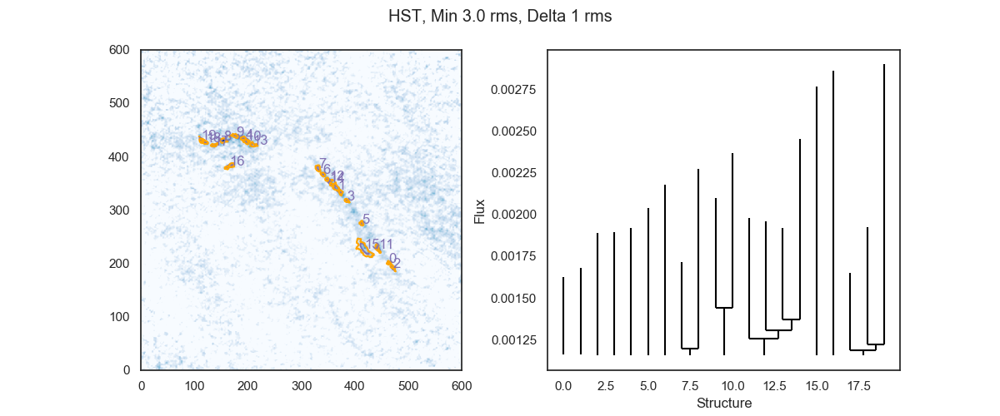

Number of clumps 20


In [29]:
plot_to_compare(d_final,p_final,'HST, Min 3.0 rms, Delta 1 rms',im=alma_im)
print('Number of clumps %d'%len(cat_final))

<IPython.core.display.Javascript object>


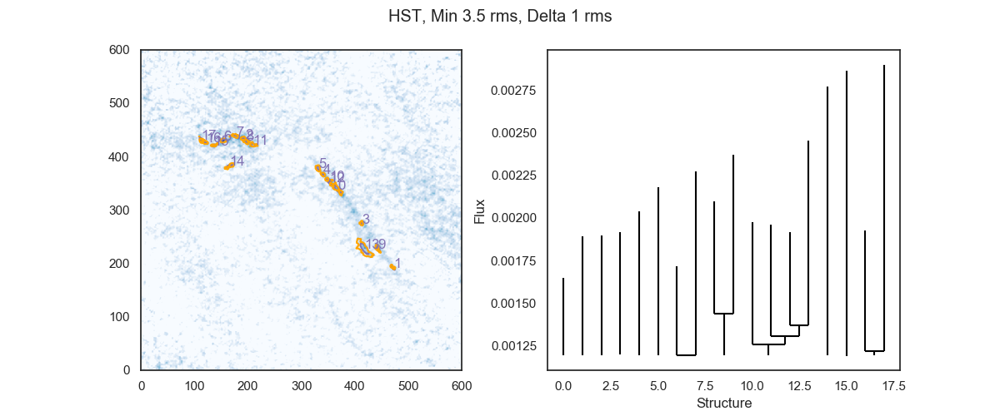

Number of clumps 18


In [30]:
d_test_max = Dendrogram.compute(crop_data,min_value=(3.1)*rms,min_delta=1*rms,min_npix=0,is_independent=all_true((is_inside_hst,min_beam_size,min_2_chan)))
p_test_max = d_test_max.plotter()
plot_to_compare(d_test_max,p_test_max,'HST, Min 3.5 rms, Delta 1 rms',im=alma_im)
cat_test_max = ppv_catalog(d_test_max.leaves, metadata,verbose=False) 
print('Number of clumps %d'%len(cat_test_max))

There are three clumps less here and we need to match the clumps between our best selection and this test

In [31]:
def is_same_clump_2d(cat1,cat2):
    print('Cat1\tCat2\t_idx1\t_idx2\tDistance')
    new_order = []
    translate = {}
    no_match = []
    for c in cat1:
        dist = [np.sqrt((t['x_cen']- c['x_cen'])**2 + (t['y_cen']- c['y_cen'])**2) for t in cat2]
        print('%d\t%d\t%d\t%d\t%0.2f'%(c.index,np.argmin(dist),c['_idx'],cat2['_idx'][np.argmin(dist)],np.min(dist)))
        if np.min(dist) < 4:
            new_order.append([np.argmin(dist),c.index])
            translate[c.index] = cat2['_idx'][np.argmin(dist)]
        else:
            no_match.append(c.index)
    print('No match for ',no_match)
    return new_order, translate

In [32]:
new_order_max, translate_max = is_same_clump_2d(cat_final,cat_test_max)

Cat1	Cat2	_idx1	_idx2	Distance
0	1	0	4	12.95
1	0	2	0	0.00
2	1	6	4	0.34
3	0	7	0	26.98
4	2	10	7	0.00
5	3	11	8	0.03
6	4	12	9	0.00
7	5	13	10	0.00
8	6	14	11	0.03
9	7	15	12	0.00
10	8	16	13	0.00
11	9	17	14	0.66
12	10	18	15	0.00
13	11	19	16	0.00
14	12	20	17	0.00
15	13	21	18	0.09
16	14	22	19	0.10
17	15	23	20	0.10
18	16	24	21	0.00
19	17	26	23	0.00
No match for  [0, 3]


In [33]:
def re_order_catalogue(cat,new_order,missing,fiducial_cat):
    
    new_order.sort(key = lambda x:x[0])
    good_order = np.transpose(new_order)[1]
    
    new_cat = cat.copy()
    new_cat.add_column(Column(name='new_idx', data=good_order),index=0)
    
    # Add missing clumps. Put all to zero
    for miss in missing:
        row = fiducial_cat[miss]
        data_dict = {k:0 for k,i in zip(row.colnames,row)} 
        data_dict['new_idx'] = miss
        data_dict['_idx'] = -99
        new_cat.add_row(data_dict)
            
    new_cat.sort(['new_idx'])
    new_cat.remove_column('new_idx')
    
    return new_cat

In [34]:
cat_test_max = re_order_catalogue(cat_test_max, new_order_max, [0, 3], cat_final)

**Fmin = Fmin_fiducial-0.5 RMS**

<IPython.core.display.Javascript object>


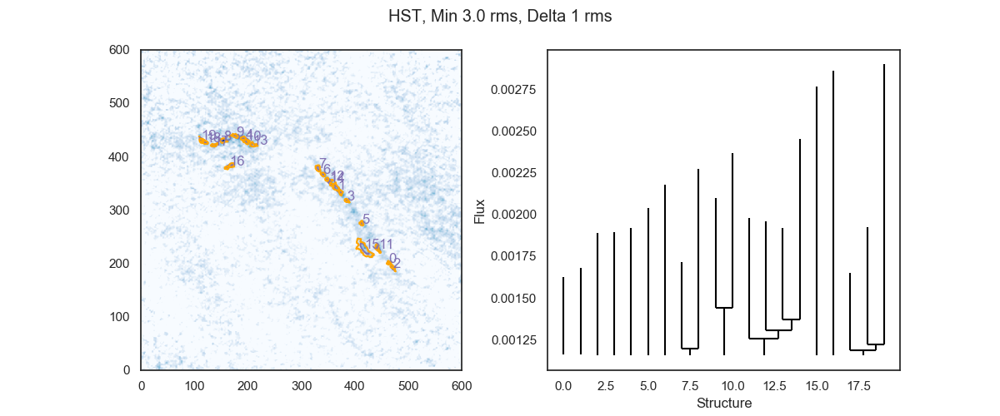

Number of clumps 20


In [35]:
plot_to_compare(d_final,p_final,'HST, Min 3.0 rms, Delta 1 rms',im=alma_im)
print('Number of clumps %d'%len(cat_final))

<IPython.core.display.Javascript object>


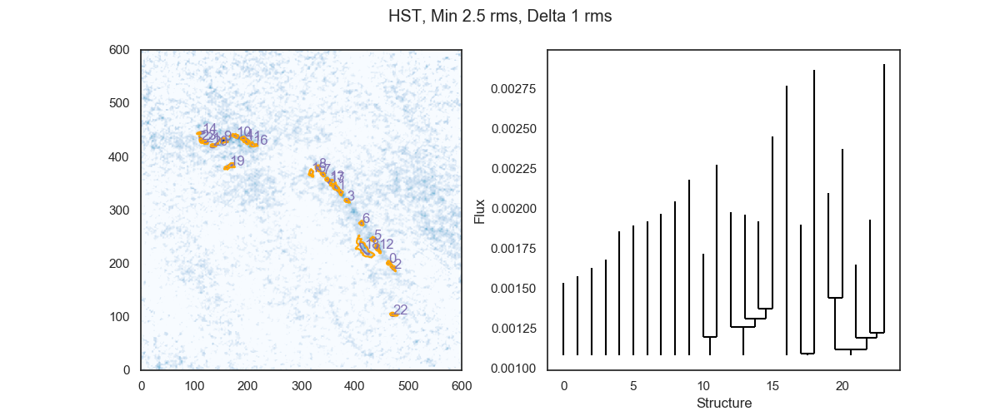

Number of clumps 24


In [36]:
d_test_min = Dendrogram.compute(crop_data,min_value=(2.8)*rms,min_delta=1*rms,min_npix=0,is_independent=all_true((is_inside_hst,min_beam_size,min_2_chan)))
p_test_min = d_test_min.plotter()
plot_to_compare(d_test_min,p_test_min,'HST, Min 2.5 rms, Delta 1 rms',im=alma_im)
cat_test_min = ppv_catalog(d_test_min.leaves, metadata,verbose=False) 
print('Number of clumps %d'%len(cat_test_min))

Now the issue is too many detections. We can use the 'is_same_clump' with the arguments reversed, to find the clumps that are likelly to be new detections

In [37]:
test,_ = is_same_clump_2d(cat_test_min,cat_final)

Cat1	Cat2	_idx1	_idx2	Distance
0	0	0	0	0.08
1	1	2	2	0.00
2	2	7	6	0.49
3	3	8	7	0.75
4	4	11	10	0.00
5	11	12	17	20.18
6	5	13	11	0.31
7	6	14	12	0.00
8	7	15	13	0.00
9	8	16	14	0.03
10	9	18	15	0.00
11	10	19	16	0.00
12	11	20	17	0.13
13	12	21	18	0.00
14	19	22	26	12.83
15	7	23	13	15.55
16	13	24	19	0.00
17	14	25	20	0.00
18	15	26	21	0.47
19	16	28	22	0.09
20	17	29	23	1.23
21	18	30	24	0.00
22	2	31	6	87.36
23	19	32	26	0.00
No match for  [5, 14, 15, 22]


After inspecting it visually, seems to work! (hurray!)
So we can remove these entries from the test catalog before ordering it.

In [38]:
cat_test_min.remove_rows([5, 14, 15, 22])

In [39]:
new_order_min, translate_min = is_same_clump_2d(cat_final,cat_test_min)

Cat1	Cat2	_idx1	_idx2	Distance
0	0	0	0	0.08
1	1	2	2	0.00
2	2	6	7	0.49
3	3	7	8	0.75
4	4	10	11	0.00
5	5	11	13	0.31
6	6	12	14	0.00
7	7	13	15	0.00
8	8	14	16	0.03
9	9	15	18	0.00
10	10	16	19	0.00
11	11	17	20	0.13
12	12	18	21	0.00
13	13	19	24	0.00
14	14	20	25	0.00
15	15	21	26	0.47
16	16	22	28	0.09
17	17	23	29	1.23
18	18	24	30	0.00
19	19	26	32	0.00
No match for  []


In [40]:
cat_test_min = re_order_catalogue(cat_test_min,new_order_min,[],cat_final)

Now we can use this to estimate some sort of uncertainty

<IPython.core.display.Javascript object>


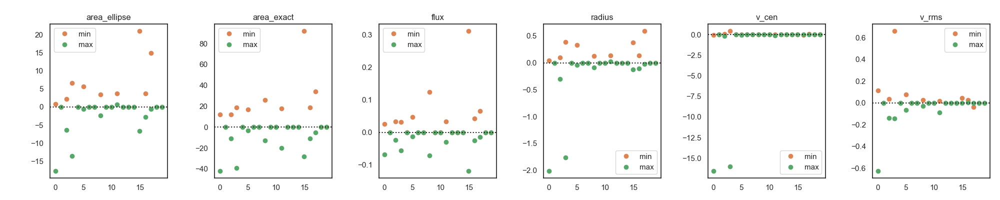

<IPython.core.display.Javascript object>


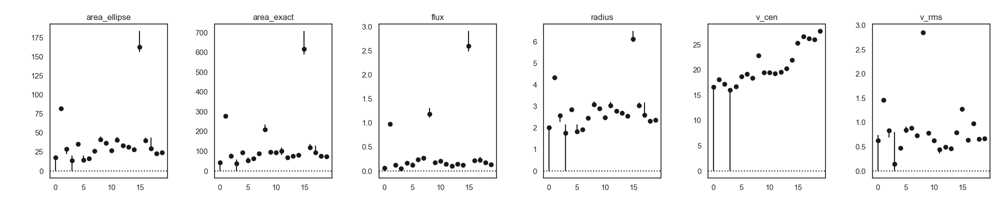

In [41]:
fig, ax = plt.subplots(1,6,figsize=(20,4))
fig.subplots_adjust(left=0.05,right=0.99,wspace=0.4)

for i, col in enumerate(['area_ellipse','area_exact','flux','radius','v_cen','v_rms']):
    ax[i].plot(cat_test_min[col]-cat_final[col],marker='o',linestyle='',color='C1',label='min')
    ax[i].plot(cat_test_max[col]-cat_final[col],marker='o',linestyle='',color='C2',label='max')
    ax[i].set_title(col)
    ax[i].axhline(0,color='k',linestyle=':')
    ax[i].legend()
    

fig, ax = plt.subplots(1,6,figsize=(20,4))
fig.subplots_adjust(left=0.05,right=0.99,wspace=0.4)
for i, col in enumerate(['area_ellipse','area_exact','flux','radius','v_cen','v_rms']):
    ax[i].errorbar(x=range(len(cat_final)),y=cat_final[col],yerr=[cat_final[col]-cat_test_max[col],cat_test_min[col]-cat_final[col]],marker='o',linestyle='',color='k')
    ax[i].set_title(col)
    ax[i].axhline(0,color='k',linestyle=':')

**Now do all again but with physical units**

In [42]:
phys_metadata = {}
phys_metadata['data_unit'] = u.Jy / u.beam
phys_metadata['velocity_scale'] = 10.335964612828652 * u.km/u.second
phys_metadata['spatial_scale'] =  abs(header['CDELT1']) * u.deg 
phys_metadata['beam_major'] =  header['BMAJ'] * u.deg # FWHM for astrodendro to work
phys_metadata['beam_minor'] =  header['BMIN'] * u.deg # FWHM for astrodendro to work
phys_metadata['wcs'] = wcs_cube

In [43]:
cat_final =  ppv_catalog(d_final.leaves, phys_metadata,verbose=False) 

cat_test_max = ppv_catalog(d_test_max.leaves, phys_metadata,verbose=False)
cat_test_max = re_order_catalogue(cat_test_max,new_order_max,[0, 3],cat_final)

cat_test_min = ppv_catalog(d_test_min.leaves, phys_metadata,verbose=False) 
cat_test_min.remove_rows([5, 14, 15, 22])
cat_test_min = re_order_catalogue(cat_test_min,new_order_min,[],cat_final)

<IPython.core.display.Javascript object>


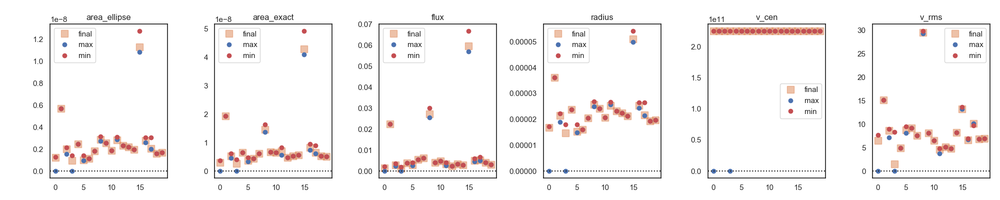

<IPython.core.display.Javascript object>


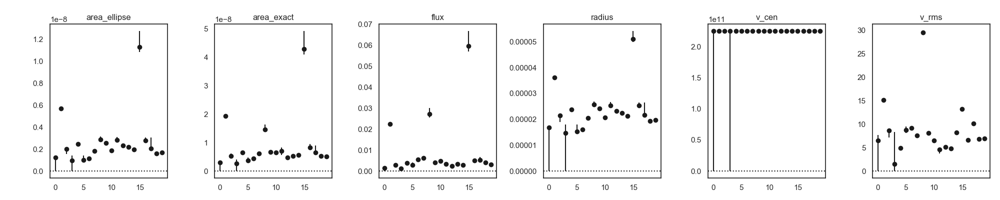

In [44]:
fig, ax = plt.subplots(1,6,figsize=(20,4))
fig.subplots_adjust(left=0.05,right=0.99,wspace=0.4)

for i, col in enumerate(['area_ellipse','area_exact','flux','radius','v_cen','v_rms']):
    ax[i].plot(cat_final[col],marker='s',linestyle='',color='C1',label='final',markersize=10,alpha=0.5)
    ax[i].plot(cat_test_max[col],marker='o',linestyle='',color='C0',label='max')
    ax[i].plot(cat_test_min[col],marker='o',linestyle='',color='C3',label='min')
    ax[i].set_title(col)
    ax[i].axhline(0,color='k',linestyle=':')
    ax[i].legend()
    

fig, ax = plt.subplots(1,6,figsize=(20,4))
fig.subplots_adjust(left=0.05,right=0.99,wspace=0.4)
for i, col in enumerate(['area_ellipse','area_exact','flux','radius','v_cen','v_rms']):
    ax[i].errorbar(x=range(len(cat_final)),y=cat_final[col],yerr=[cat_final[col]-cat_test_max[col],cat_test_min[col]-cat_final[col]],marker='o',linestyle='',color='k')
    ax[i].set_title(col)
    ax[i].axhline(0,color='k',linestyle=':')

Add uncertainties

In [45]:
for col in cat_final.colnames[1:]:
    if col+'_uerr' not in cat_final.colnames:
        err_low = cat_final[col]-cat_test_max[col]
        err_up = cat_test_min[col]-cat_final[col]
        new_col1 = Column(name=col+'_uerr',data=err_up,unit=cat_final[col].unit)
        new_col2 = Column(name=col+'_lerr',data=err_low,unit=cat_final[col].unit)
        cat_final.add_columns([new_col1,new_col2])
cat_final.show_in_notebook()

idx,_idx,area_ellipse,area_exact,flux,major_sigma,minor_sigma,position_angle,radius,v_cen,v_rms,x_cen,y_cen,area_ellipse_uerr,area_ellipse_lerr,area_exact_uerr,area_exact_lerr,flux_uerr,flux_lerr,major_sigma_uerr,major_sigma_lerr,minor_sigma_uerr,minor_sigma_lerr,position_angle_uerr,position_angle_lerr,radius_uerr,radius_lerr,v_cen_uerr,v_cen_lerr,v_rms_uerr,v_rms_lerr,x_cen_uerr,x_cen_lerr,y_cen_uerr,y_cen_lerr
,,deg2,deg2,Jy,deg,deg,deg,deg,,km / s,,,deg2,deg2,deg2,deg2,Jy,Jy,deg,deg,deg,deg,deg,deg,deg,deg,,,km / s,km / s,,,,
0,0,1.2267998936504193e-09,2.916666666666433e-09,0.0015400496141959744,1.8134963131782698e-05,1.553313500917233e-05,160.4226851342397,1.6783707299412227e-05,225634124249.41162,6.486619857629273,73.5263575363316,-10.223613734705598,5.578333837387663e-11,1.2267998936504193e-09,8.333333333332663e-10,2.916666666666433e-09,0.0005899757861465458,0.0015400496141959744,5.759077725275377e-08,1.8134963131782698e-05,6.548931681036701e-07,1.553313500917233e-05,-4.0882611935991235,160.4226851342397,3.773408998114584e-07,1.6783707299412227e-05,472388.4807128906,225634124249.41162,1.1748833049055794,6.486619857629273,-6.587626870668828e-07,73.5263575363316,-2.1024282759185553e-08,-10.223613734705598
1,2,5.697901492444706e-09,1.930555555555401e-08,0.02235573882282229,7.09323455521144e-05,1.8444746041355854e-05,133.62163355344154,3.617083216939372e-05,225622024166.37787,15.153729646057108,73.52716391855206,-10.222471204996273,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,6,1.9982459668497515e-09,5.277777777777355e-09,0.0029277270454489976,3.232777900212223e-05,1.4193030658801643e-05,130.75114212321412,2.142029781557868e-05,225629465213.77573,8.566985418112681,73.52628799450162,-10.223699670772907,1.564037402295845e-10,4.3805421636661943e-10,8.333333333332672e-10,7.638888888888273e-10,0.0007557594653885662,0.0005156516231586391,5.512873015600604e-07,-1.264236110479577e-07,8.542930186085723e-07,3.15455514929189e-06,1.3443220768943434,-1.7796380762785589,8.224977120194389e-07,2.492938762447507e-06,-376609.1793823242,-1332576.439239502,0.34458869578338636,1.4256270245709386,-2.8597367531801865e-06,4.179217683031311e-07,-3.012733152729652e-06,-2.786174889024551e-06
3,7,9.432002658296893e-10,2.7083333333331165e-09,0.0012868497553708148,2.1555413991852358e-05,1.0047305565969926e-05,148.84853289448435,1.4716447634436928e-05,225638343856.56433,1.4708821301420587,73.52702052337463,-10.222646225857007,4.5734800471235247e-10,9.432002658296893e-10,1.319444444444339e-09,2.7083333333331165e-09,0.0007340066478109056,0.0012868497553708148,7.856309489372553e-07,2.1555413991852358e-05,4.347197075787719e-06,1.0047305565969926e-05,-15.810490587602146,148.84853289448435,3.216433629314926e-06,1.4716447634436928e-05,-3435816.2043762207,225638343856.56433,6.8284150392458525,1.4708821301420587,1.223970969022048e-08,73.52702052337463,6.287490693424047e-06,-10.222646225857007
4,10,2.4486113140005744e-09,6.527777777777255e-09,0.0037374925166362392,4.132526322335587e-05,1.3605242520024378e-05,160.70230874582526,2.3711605351759737e-05,225633329640.46524,4.88727567130721,73.52862914226041,-10.2216864008946,4.1359030627651384e-25,-4.1359030627651384e-25,0.0,0.0,0.0,0.0,0.0,-6.776263578034403e-21,1.6940658945086007e-21,0.0,2.842170943040401e-14,0.0,0.0,0.0,0.0,0.0,0.0,8.881784197001252e-16,0.0,0.0,0.0,0.0
5,11,1.0071761562020764e-09,3.611111111110822e-09,0.0029006337855382934,1.6868753064870782e-05,1.3709591653443664e-05,120.23353820233643,1.5207357305664738e-05,225617661372.21442,8.704381891427579,73.5267834646999,-10.223002051786807,3.96741140126219e-10,4.1246932166742343e-11,1.180555555555461e-09,2.083333333333166e-10,0.0011035936837200566,0.00029567816126236214,4.382820627147605e-06,2.4387420759140903e-07,1.459252648117297e-06,3.685763982830533e-07,27.474441909666325,-0.6781433585398702,2.7470798199422895e-06,3.1464894048947535e-07,-52278.6552734375,-133579.03778076172,0.7841746545844757,0.66350314253914,

Correct for beam size. There are a couple of clumps that have sizes too small

<IPython.core.display.Javascript object>


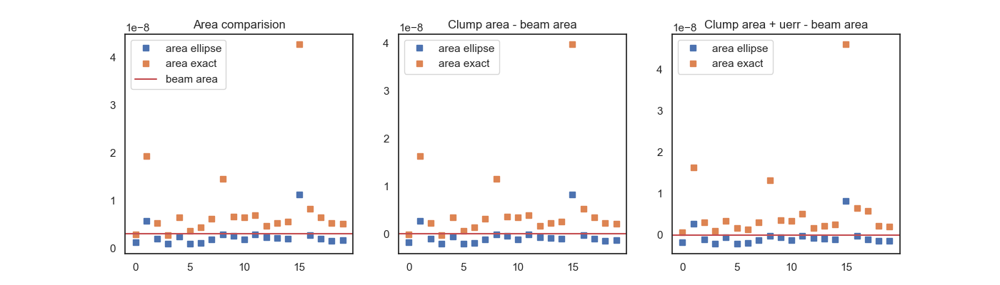

In [46]:
fig, ax = plt.subplots(1,3,figsize=(14,4))

ax[0].set_title('Area comparision')
ax[0].plot(cat_final['area_ellipse'],marker='s',linestyle='',label='area ellipse')
ax[0].plot(cat_final['area_exact'],marker='s',linestyle='',label='area exact')
ax[0].axhline(beam_area,color='r',label='beam area')
ax[0].legend()

ax[1].set_title('Clump area - beam area')
ax[1].plot(cat_final['area_ellipse']-beam_area,marker='s',linestyle='',label='area ellipse')
ax[1].plot(cat_final['area_exact']-beam_area,marker='s',linestyle='',label='area exact')
ax[1].axhline(0,color='r')
ax[1].legend()

ax[2].set_title('Clump area + uerr - beam area')
ax[2].plot(cat_final['area_ellipse']-beam_area,marker='s',linestyle='',label='area ellipse')
ax[2].plot(cat_final['area_exact']+ cat_final['area_exact_uerr']-beam_area,marker='s',linestyle='',label='area exact')
ax[2].axhline(0,color='r')
ax[2].legend()

In [47]:
def deconvolve_radius(catalogue,metadata):
    beam_area = np.pi /(4*np.log(2)) * metadata['beam_major'].value * metadata['beam_minor'].value
    corrected_area = catalogue['area_exact'] - beam_area
    corrected_radius = np.sqrt(corrected_area/np.pi)
    corrected_radius_lerr = 1/2 * 1/np.sqrt(np.pi) * 1/np.sqrt(corrected_area) * catalogue['area_exact_lerr']
    corrected_radius_uerr = 1/2 * 1/np.sqrt(np.pi) * 1/np.sqrt(corrected_area) * catalogue['area_exact_uerr']
    
    # Check if there are negative values
    not_ok = np.where(np.isnan(corrected_radius))
    corrected_area[not_ok] =catalogue['area_exact'][not_ok]
    corrected_radius[not_ok] = np.sqrt(catalogue['area_exact'][not_ok]/np.pi)
    corrected_radius_uerr[not_ok] = 1/2 * 1/np.sqrt(np.pi) * 1/np.sqrt(catalogue['area_exact'][not_ok]) * catalogue['area_exact_uerr'][not_ok]
    corrected_radius_lerr[not_ok] = np.sqrt(catalogue['area_exact'][not_ok]/np.pi)
    higher_limit = np.zeros_like(corrected_radius)
    higher_limit[not_ok] = 1
    
    # Old way. I think it's confusing because upper limits are not very clear
    '''if np.any(np.isnan(corrected_radius)):
        bad_radius = np.where(np.isnan(corrected_radius))
        for c in bad_radius:
            corrected_area = catalogue[c]['area_exact'] + catalogue[c]['area_exact_uerr'] - beam_area
            corrected_radius[c] = np.sqrt(corrected_area/np.pi)
            corrected_radius_lerr[c] = 1/2 * 1/np.sqrt(np.pi) * 1/np.sqrt(corrected_area) * catalogue[c]['area_exact_lerr']
            corrected_radius_uerr[c] = 0
    '''
    catalogue.add_column(Column(name='corrected_area', data=corrected_area, unit=u.deg**2))
    catalogue.add_column(Column(name='radius_corrected', data=corrected_radius, unit=u.deg))
    catalogue.add_column(Column(name='radius_corrected_lerr', data=corrected_radius_lerr, unit=u.deg))
    catalogue.add_column(Column(name='radius_corrected_uerr', data=corrected_radius_uerr, unit=u.deg))
    catalogue.add_column(Column(name='radius_not_corrected', data=higher_limit))

    return catalogue

In [48]:
cat_final = deconvolve_radius(cat_final,phys_metadata)

In [48]:
cat_final.show_in_notebook()

idx,_idx,area_ellipse,area_exact,flux,major_sigma,minor_sigma,position_angle,radius,v_cen,v_rms,x_cen,y_cen,area_ellipse_uerr,area_ellipse_lerr,area_exact_uerr,area_exact_lerr,flux_uerr,flux_lerr,major_sigma_uerr,major_sigma_lerr,minor_sigma_uerr,minor_sigma_lerr,position_angle_uerr,position_angle_lerr,radius_uerr,radius_lerr,v_cen_uerr,v_cen_lerr,v_rms_uerr,v_rms_lerr,x_cen_uerr,x_cen_lerr,y_cen_uerr,y_cen_lerr,radius_corrected,radius_corrected_lerr,radius_corrected_uerr,radius_not_corrected
,,deg2,deg2,Jy,deg,deg,deg,deg,,km / s,,,deg2,deg2,deg2,deg2,Jy,Jy,deg,deg,deg,deg,deg,deg,deg,deg,,,km / s,km / s,,,,,deg,deg,deg,deg2
0,0,1.2267998936504193e-09,2.916666666666433e-09,0.0015400496141959744,1.8134963131782698e-05,1.553313500917233e-05,160.4226851342397,1.6783707299412227e-05,225634124249.41162,6.486619857629273,73.5263575363316,-10.223613734705598,5.578333837387663e-11,1.2267998936504193e-09,8.333333333332663e-10,2.916666666666433e-09,0.0005899757861465458,0.0015400496141959744,5.759077725275377e-08,1.8134963131782698e-05,6.548931681036701e-07,1.553313500917233e-05,-4.0882611935991235,160.4226851342397,3.773408998114584e-07,1.6783707299412227e-05,472388.4807128906,225634124249.41162,1.1748833049055794,6.486619857629273,-6.587626870668828e-07,73.5263575363316,-2.1024282759185553e-08,-10.223613734705598,3.0469719964296496e-05,3.0469719964296496e-05,4.352817137756641e-06,1.0
1,2,5.697901492444706e-09,1.930555555555401e-08,0.02235573882282229,7.09323455521144e-05,1.8444746041355854e-05,133.62163355344154,3.617083216939372e-05,225622024166.37787,15.153729646057108,73.52716391855206,-10.222471204996273,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,7.198732297521332e-05,0.0,0.0,0.0
2,6,1.9982459668497515e-09,5.277777777777355e-09,0.0029277270454489976,3.232777900212223e-05,1.4193030658801643e-05,130.75114212321412,2.142029781557868e-05,225629465213.77573,8.566985418112681,73.52628799450162,-10.223699670772907,1.564037402295845e-10,4.3805421636661943e-10,8.333333333332672e-10,7.638888888888273e-10,0.0007557594653885662,0.0005156516231586391,5.512873015600604e-07,-1.264236110479577e-07,8.542930186085723e-07,3.15455514929189e-06,1.3443220768943434,-1.7796380762785589,8.224977120194389e-07,2.492938762447507e-06,-376609.1793823242,-1332576.439239502,0.34458869578338636,1.4256270245709386,-2.8597367531801865e-06,4.179217683031311e-07,-3.012733152729652e-06,-2.786174889024551e-06,2.6776749639978364e-05,4.540382767672272e-06,4.953144837460666e-06,0.0
3,7,9.432002658296893e-10,2.7083333333331165e-09,0.0012868497553708148,2.1555413991852358e-05,1.0047305565969926e-05,148.84853289448435,1.4716447634436928e-05,225638343856.56433,1.4708821301420587,73.52702052337463,-10.222646225857007,4.5734800471235247e-10,9.432002658296893e-10,1.319444444444339e-09,2.7083333333331165e-09,0.0007340066478109056,0.0012868497553708148,7.856309489372553e-07,2.1555413991852358e-05,4.347197075787719e-06,1.0047305565969926e-05,-15.810490587602146,148.84853289448435,3.216433629314926e-06,1.4716447634436928e-05,-3435816.2043762207,225638343856.56433,6.8284150392458525,1.4708821301420587,1.223970969022048e-08,73.52702052337463,6.287490693424047e-06,-10.222646225857007,2.9361356833106858e-05,2.9361356833106858e-05,7.152125382423466e-06,1.0
4,10,2.4486113140005744e-09,6.527777777777255e-09,0.0037374925166362392,4.132526322335587e-05,1.3605242520024378e-05,160.70230874582526,2.3711605351759737e-05,225633329640.46524,4.88727567130721,73.52862914226041,-10.2216864008946,4.1359030627651384e-25,-4.1359030627651384e-25,0.0,0.0,0.0,0.0,0.0,-6.776263578034403e-21,1.6940658945086007e-21,0.0,2.842170943040401e-14,0.0,0.0,0.0,0.0,0.0,0.0,8.881784197001252e-16,0.0,0.0,0.0,0.0,3.338984395009638e-05,0.0,0.0,0.0
5,11,1.0071761562020764e-09,3.611111111110822e-09,0.0029006337855382934,1.6868753064870782e-05,1.3709591653443664e-05,120.23353820233643,1.5207357305664738e-05,225617661372.21442,8.704381891427579,73.5267834646999,-10.223002051786807

## Extract spectra from clumps and fit line width

In [49]:
from astropy.modeling import models 

def fit_with_gaussian(leaf,sp,xaxis,plot=True):
    xaxis = range(len(sp))
    g = models.Gaussian1D(amplitude=0.1, mean=leaf.get_peak()[0][0], stddev=5)
    fit = fitting.LevMarLSQFitter()
    fit_g = fit(g, xaxis, sp)
    if plot:
        ax[n].plot(fit_g(xaxis),color='red',linewidth=1.5,label='fit',linestyle=':')
    std = fit_g.stddev.value*phys_metadata['velocity_scale']
    return std.value
    
    
def extract_spectrum(im_mask):
    sp = 0
    qq, pp = np.where(im_mask)
    for (p,q)in zip(qq,pp):
        sp += crop_data[:,p,q]
    xaxis = range(len(sp))
    return sp, xaxis

def deconvolve_channel(width):
    return np.sqrt(width**2 - phys_metadata['velocity_scale'].value**2/(2*np.pi))


<IPython.core.display.Javascript object>


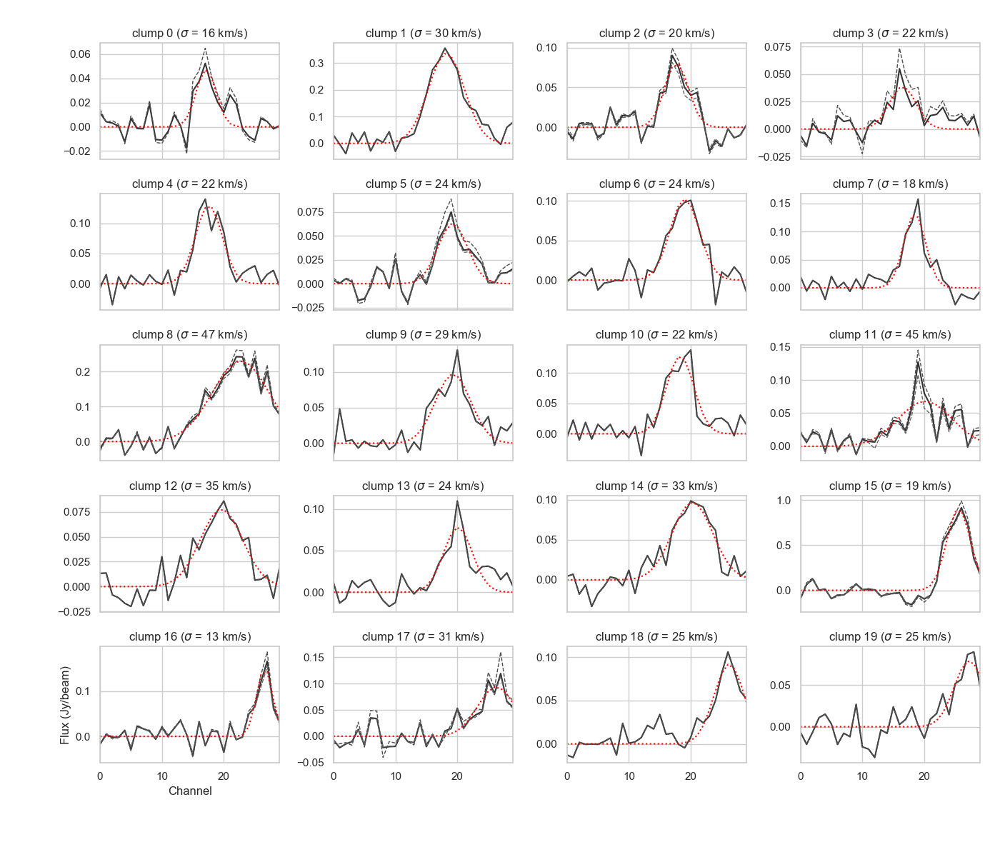

no clump for max
no clump for max


In [47]:
bg_spec = np.nanmean(crop_data[:,280:340,190:240],axis=(1,2))
fig, ax = plt.subplots(5,4,figsize=(14,12))
fig.subplots_adjust(top=0.95,left=0.1,right=0.98,hspace=0.3,wspace=0.3)
ax = ax.ravel()
width = []
width_channel_corrected = []
width_unc = []


from_n_to_idx_max = {l.idx:n for n,l in enumerate(d_test_max.leaves)}
from_n_to_idx_min = {l.idx:n for n,l in enumerate(d_test_min.leaves)}
    
for n in range(len(cat_final)):
    
    leaf = d_final.leaves[idx_to_dendro_idx[n]]
    
    # spectrum from final selection
    im_mask = np.nansum(leaf.get_mask(),axis=0)
    im_mask[im_mask >0] = 1
    sp, xaxis = extract_spectrum(im_mask)
    ax[n].plot(sp,color='0.2',linewidth=1.5,label='data')
   
    # Spectrum from Fmin+0.5rms
    hidden_idx_max = translate_max.get(n,None) # n to _idx
    n_max = from_n_to_idx_max.get(hidden_idx_max,None) # _idx to position
    if n_max is None:
        print('no clump for max')
        std_max = 0
    else:
        leaf_max = d_test_max.leaves[n_max]
        im_mask_max = np.nansum(leaf_max.get_mask(),axis=0)
        sp_max,_ = extract_spectrum(im_mask_max)
        ax[n].plot(sp_max,color='0.4',linewidth=1.,linestyle='--',label='+ 0.5 RMS')
        std_max = fit_with_gaussian(leaf_max,sp_max,xaxis,plot=False)
    
    # Spectrum from Fmin-0.5rms
    hidden_idx_min = translate_min.get(n,None) # n to _idx
    n_min = from_n_to_idx_min.get(hidden_idx_min,None) # _idx to position
    if n_min is None:
        print('no clump for min')
        std_min = 0
    else:
        leaf_min = d_test_min.leaves[n_min]
        im_mask_min = np.nansum(leaf_min.get_mask(),axis=0)
        sp_min,_ = extract_spectrum(im_mask_min)
        ax[n].plot(sp_min,color='0.3',linewidth=1.,linestyle='--',label='data -0.5 RMS')
        std_min = fit_with_gaussian(leaf_min,sp_min,xaxis,plot=False)
    
    # Fit with Gaussian
    std = fit_with_gaussian(leaf,sp,xaxis)
    ax[n].set_title('clump %d ($\sigma$ = %d km/s)'%(n,std))
    ax[n].set_xlim(0,29)
    
    width.append(std)
    width_channel_corrected.append(deconvolve_channel(std))
    width_unc.append(np.mean((abs(std-std_min),abs(std-std_max))))

ax[16].set_ylabel('Flux (Jy/beam)')
ax[16].set_xlabel('Channel')

for x in ax[:16]:
    x.set_xticklabels([])

fig.savefig('../Plots/a521_spectra.jpeg')

Add width to the final catalogue

In [48]:
cat_final.add_column(Column(name='measured_line_width', data=width, unit='km/s'))
cat_final.add_column(Column(name='line_width', data=width_channel_corrected, unit='km/s'))
cat_final.add_column(Column(name='line_width_unc', data=width_unc, unit='km/s'))

Re-add the part of the multiple images

In [49]:
cat_final.add_column(col_multiple,index=1)    
cat_final.add_column(Column(clump_id,name='clump_id'),index=2)

Save

In [50]:
cat_final.write('a521_catalogue.txt',format='ascii.fixed_width_two_line')
cat_final.write('a521_catalogue.fits')

## Same thing for noise

In [58]:
def deconvolve_radius_noise(catalogue,metadata):
    beam_area = np.pi /(4*np.log(2)) * metadata['beam_major'].value * metadata['beam_minor'].value
    corrected_area = catalogue['area_exact'] - beam_area
    corrected_radius = np.sqrt(corrected_area/np.pi)
    
    ## Test the ones that are smaller than the area
    not_ok = np.where(np.isnan(corrected_radius))
    corrected_area[not_ok] =catalogue['area_exact'][not_ok]
    higher_limit = np.zeros_like(corrected_radius)
    higher_limit[not_ok] = 1 
    corrected_radius[not_ok] = np.sqrt(catalogue['area_exact']/np.pi)[not_ok]
    
    catalogue.add_column(Column(name='corrected_area', data=corrected_area, unit=u.deg))
    catalogue.add_column(Column(name='radius_corrected', data=corrected_radius, unit=u.deg))
    catalogue.add_column(Column(name='radius_not_corrected', data=higher_limit))

    return catalogue

In [59]:
cat_noise =  ppv_catalog(d_noise.leaves, phys_metadata,verbose=False) 
cat_noise = deconvolve_radius_noise(cat_noise,phys_metadata)
cat_noise.show_in_notebook()

idx,_idx,area_ellipse,area_exact,flux,major_sigma,minor_sigma,position_angle,radius,v_cen,v_rms,x_cen,y_cen,corrected_area,radius_corrected,radius_not_corrected
,,deg2,deg2,Jy,deg,deg,deg,deg,,km / s,,,deg,deg,deg2
0,0,2.549650469161932e-09,5.416666666666233e-09,0.002198564210623401,2.468570449473059e-05,2.3715767589861534e-05,52.87983563883816,2.4195876313724016e-05,225669572064.22986,1.5554152207983942,73.52947382200084,-10.224697684008776,2.3913929812942647e-09,2.7589926199547785e-05,0.0
1,1,1.3226277554816173e-09,2.7777777777775555e-09,0.001089920588928864,2.2802416643562373e-05,1.3318607478746815e-05,177.30368425270726,1.7426888329316013e-05,225668551479.12823,3.7290448935694553,73.52608245164232,-10.220945154633442,2.7777777777775555e-09,2.973540193587833e-05,1.0
2,2,1.1445726719958576e-09,3.055555555555311e-09,0.0015901272200179043,1.753316458880709e-05,1.498943030226446e-05,147.95098889062385,1.6211481998326225e-05,225663846565.76178,4.438608593750296,73.52597585326215,-10.220950527025884,3.0281870183342804e-11,3.1046768996937787e-06,0.0
3,3,7.631261265506426e-10,2.2916666666664833e-09,0.0009945862248440223,2.050083110791781e-05,8.547260077780368e-06,166.3308874663425,1.3237293352117863e-05,225638697254.10132,1.5997722900849884,73.5257283573616,-10.222275786130698,2.2916666666664833e-09,2.700852006011798e-05,1.0
4,4,1.0081240770883813e-09,2.847222222221994e-09,0.0013757783047438884,2.2699854806143655e-05,1.0197482581265963e-05,138.58305457205088,1.5214511953490863e-05,225640090825.92004,4.157072281390199,73.52585751339052,-10.22152415948044,2.847222222221994e-09,3.010479997434699e-05,1.0
5,5,1.5868828346785366e-09,5.416666666666233e-09,0.0028991343895841334,3.111376451187642e-05,1.1711010392459408e-05,61.05407761147073,1.9088573009712366e-05,225631764395.91727,8.084482384399609,73.52628149627655,-10.220917284098016,2.3913929812942647e-09,2.7589926199547785e-05,0.0
6,6,8.414257961414573e-10,3.2638888888886276e-09,0.0021203712631690025,1.6171119152434306e-05,1.1947521193570262e-05,119.62780698041323,1.3899812545407181e-05,225631326324.25955,6.834648449470833,73.5259660491827,-10.220798013518849,2.386152035166594e-10,8.715135011754545e-06,0.0
7,7,3.5833170568257102e-09,6.8055555555550104e-09,0.0028884038008304253,4.7383064270532964e-05,1.736457498538179e-05,171.96272646060123,2.8684260014210485e-05,225615360791.78955,8.6973376622922,73.52619452980815,-10.22099794879619,3.780281870183043e-09,3.46886305846831e-05,0.0
8,8,1.0511823076639427e-09,3.1249999999997496e-09,0.0014368660126612958,2.3564257298119832e-05,1.0242980617529159e-05,-172.44473544151276,1.55360300840051e-05,225621776819.59882,3.601513842731471,73.52585312888533,-10.221586599290854,9.972631462778139e-11,5.6341700239430115e-06,0.0


Spectra

<IPython.core.display.Javascript object>


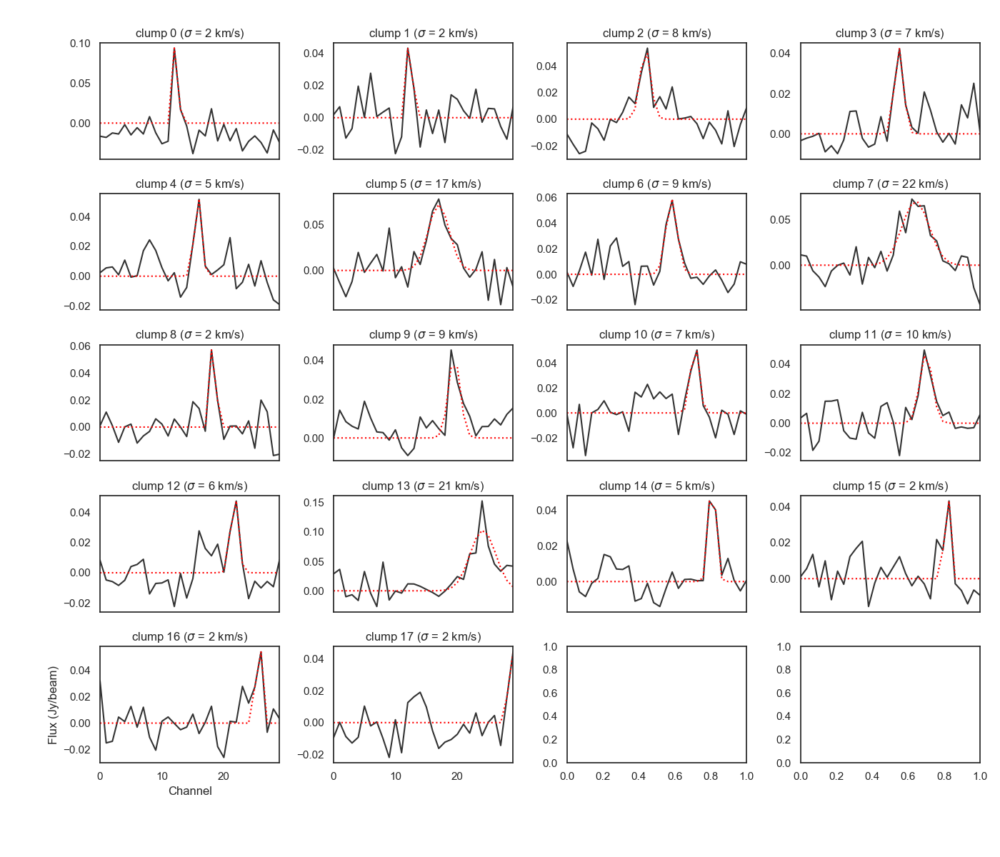

In [60]:
bg_spec = np.nanmean(crop_data[:,280:340,190:240],axis=(1,2))
fig, ax = plt.subplots(5,4,figsize=(14,12))
fig.subplots_adjust(top=0.95,left=0.1,right=0.98,hspace=0.3,wspace=0.3)
ax = ax.ravel()
width_noise = []
width_channel_corrected_noise = []


def fit_with_gaussian(leaf,sp,xaxis,plot=True):
    xaxis = range(len(sp))
    g = models.Gaussian1D(amplitude=0.02, mean=leaf.get_peak()[0][0], stddev=1)
    fit = fitting.LevMarLSQFitter()
    fit_g = fit(g, xaxis, sp)
    if plot:
        ax[n].plot(fit_g(xaxis),color='red',linewidth=1.5,label='fit',linestyle=':')
    std = fit_g.stddev.value*phys_metadata['velocity_scale']
    return std.value
    
    
for leaf in d_noise.leaves: # there is no hierarchical structure, so the order is simpler
        
    n = leaf.idx
    
    # spectrum from final selection
    im_mask = np.nansum(leaf.get_mask(),axis=0)
    im_mask[im_mask >0] = 1
    sp, xaxis = extract_spectrum(im_mask)
    ax[n].plot(sp,color='0.2',linewidth=1.5,label='data')
    
    # Fit with Gaussian
    std = fit_with_gaussian(leaf,sp,xaxis)
    ax[n].set_title('clump %d ($\sigma$ = %d km/s)'%(n,std))
    
    width_noise.append(std)
    width_channel_corrected_noise.append(deconvolve_channel(std))

    ax[n].set_xlim(0,29)
    
ax[16].set_ylabel('Flux (Jy/beam)')
ax[16].set_xlabel('Channel')

for x in ax[:16]:
    x.set_xticklabels([])
    
#fig.savefig('../Plots/a521_noise_spectra.jpeg')

Add to catalogue

In [61]:
width_channel_corrected_noise = np.array(width_channel_corrected_noise)
width_noise = np.array(width_noise)

## Test the line width that are smaller than the channel width
not_ok = np.where(np.isnan(width_channel_corrected_noise))[0]
higher_limit = np.zeros_like(width_channel_corrected_noise)
higher_limit[not_ok] = 1 
width_channel_corrected_noise[not_ok] = width_noise[not_ok]

cat_noise.add_column(Column(name='line_width', data=width_channel_corrected_noise, unit='km/s'))
cat_noise.add_column(Column(name='line_width_not_corrected', data=higher_limit))

cat_noise.write('a521_noise_catalogue.fits',overwrite=True)

### Smaller catalogue

In [51]:
keeping_columns = ['_idx','mlt_region',
                   'flux', 'flux_lerr','flux_uerr',
                   'radius_corrected', 'radius_corrected_lerr','radius_corrected_uerr','radius_not_corrected', # radius corrected for beam size (mostly nans)
                    'corrected_area','area_exact_lerr','area_exact_uerr',
                   'line_width','line_width_unc'] # line width sigma corrected for channel width
    
cat_small = cat_final[keeping_columns]

In [52]:
cat_small.write('a521_small_catalogue.fits')

In [57]:
cat_small.show_in_notebook()

NameError: name 'cat_small' is not defined

Smaller catalogue noise

In [63]:
cat_noise_small = cat_noise['_idx','flux','radius_corrected','radius_not_corrected','corrected_area','line_width','line_width_not_corrected']
cat_noise_small.write('a521_noise_small_catalogue.fits',overwrite=True)
cat_noise_small.show_in_notebook()

idx,_idx,flux,radius_corrected,radius_not_corrected,corrected_area,line_width,line_width_not_corrected
,,Jy,deg,deg2,deg,km / s,
0,0,0.002198564210623401,2.7589926199547785e-05,0.0,2.3913929812942647e-09,2.5659635581033373,1.0
1,1,0.001089920588928864,2.973540193587833e-05,1.0,2.7777777777775555e-09,2.6609209229357806,1.0
2,2,0.0015901272200179043,3.1046768996937787e-06,0.0,3.0281870183342804e-11,7.787813615625709,0.0
3,3,0.0009945862248440223,2.700852006011798e-05,1.0,2.2916666666664833e-09,6.354605784266545,0.0
4,4,0.0013757783047438884,3.010479997434699e-05,1.0,2.847222222221994e-09,4.30571995819926,0.0
5,5,0.0028991343895841334,2.7589926199547785e-05,0.0,2.3913929812942647e-09,17.046046535509664,0.0
6,6,0.0021203712631690025,8.715135011754545e-06,0.0,2.386152035166594e-10,8.407190324206827,0.0
7,7,0.0028884038008304253,3.46886305846831e-05,0.0,3.780281870183043e-09,22.340279106436356,0.0
8,8,0.0014368660126612958,5.6341700239430115e-06,0.0,9.972631462778139e-11,2.594144082380928,1.0
